# Multimodal Fusion: Model Fusion

# Section 0: Import modules, set variables, load functions 

In [3]:
import os
import numpy as np
import pandas as pd
from keras import backend as K
from sklearn.metrics import confusion_matrix    
from sklearn import metrics
from keras.models import Model
from keras.layers import Dense, Reshape, concatenate, Lambda, Average, Maximum, Add, Multiply, Concatenate, BatchNormalization, Activation
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras.layers.embeddings import Embedding
from keras.engine.input_layer import Input
from keras.optimizers import Adam
from utils import *
from keras.activations import relu
from sklearn.model_selection import StratifiedKFold
import random
import dill
import matplotlib.pyplot as plt
from scipy import ndimage
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from PIL import Image
import io
from keras.utils.training_utils import multi_gpu_model
import tensorflow as tf

Using TensorFlow backend.


In [4]:
from keras import backend as K
print(K.tensorflow_backend._get_available_gpus())
G = len(K.tensorflow_backend._get_available_gpus())

['/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1']


In [5]:
SRC = 'indiana'

if SRC=='PMC':
    CLASSES = {0: 'bar', 1: 'gel', 2: 'map', 3: 'network', 4: 'plot',
             5: 'text', 6: 'box', 7: 'heatmap',8: 'medical', 9: 'nxmls', 10: 'screenshot',
             11: 'topology', 12: 'diagram', 13: 'histology', 14: 'microscopy',
             15: 'photo', 16: 'sequence', 17: 'tree', 18: 'fluorescence', 19: 'line',
             20: 'molecular', 21: 'pie', 22: 'table'}
    
    class_names = ['bar', 'gel', 'network', 'plot', 'histology', 'sequence',
                               'line', 'molecular']
elif SRC=='indiana':
    class_names = ['normal', 'abnormal']
else:
    class_names = ['cat','dog']
num_class = len(class_names)
NN_Class_Names = dict(enumerate(class_names))
test_size = 0.2
epochs = 150
bs=150
#Set parameters
create_word_vec = False
w2v_epochs = 20
w2v_window_size=5
w2v_filters=''
seed = 0
max_text_len = 200
vocabulary_size = 10000
csv_fname = 'image_list.csv'
coco_loc = '/home/kevin/Documents/Lab/coco_dataset'
pmc_loc = '/gpfs/ysm/pi/krauthammer/kl533/'
indiana_loc = '/gpfs/ysm/pi/krauthammer/kl533/Indiana_University_Chest_X-ray_Collection'
suffix = '.png'
filters = ''
use_glove = False
LOAD_IMG_MODEL_WEIGHTS = False
LOAD_TXT_MODEL_WEIGHTS = False
CHANNELS = 3#should be either 3 or 1 for the number of channels
shape = (100,100,CHANNELS)#image shape
embedding_output_dim = 100
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=0, mode='auto', baseline=None)
nltk.download('punkt')
nltk.download('stopwords')
plt.rcParams["figure.dpi"] = 600
n_splits = 5

[nltk_data] Downloading package punkt to /home/kl533/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/kl533/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
def Generate_Model(model_type = 'multimodal'):
    #set up our text input
    if model_type == 'multimodal':
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=False, weights=[embedding_weights])
        text_embedding = embedding(input_text)
        image_input = Input(shape, name='image_input')
        #get branches
        img = get_img_branch()
        txt = get_text_branch()            
        #set up our image branch
        image_branch = (img)(image_input)
        #set up text branch
        text_branch = (txt)(text_embedding)
        
        concat = concatenate([image_branch, text_branch])
            #Dense section
        x = Dense(1024, activation='relu', name='dense_layer1')(concat)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, activation='relu', name='dense_layer2')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='output')(x)
        classificationModel = Model(inputs=[input_text, image_input], outputs=[output])
    #set up our text input
    if model_type == 'multimodal_square_kernel':
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=False, weights=[embedding_weights])
        embedded_text = embedding(input_text)
        text_embedding = Lambda(embedding_3Ch)(embedded_text)
        #set up our image input
        image_input = Input(shape, name='image_input')
        #get branches
        img = get_img_branch()
        txt = get_text_branch_2D()
        #set up our image branch
        image_branch = (img)(image_input)
        #set up text branch
        text_branch = (txt)(text_embedding)
        
        concat = concatenate([image_branch, text_branch])
            #Dense section
        x = Dense(1024, activation='relu', name='dense_layer1')(concat)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, activation='relu', name='dense_layer2')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='output')(x)
        classificationModel = Model(inputs=[input_text, image_input], outputs=[output])
    if G > 1:
        classificationModel = get_multi_gpu_model(classificationModel, G)
    return classificationModel

# Section 1: Initalize variables and load data

In [7]:
# Load our data from source

print('Getting Data')
if SRC == 'PMC':
    image_classes = [list(CLASSES.keys())[list(CLASSES.values()).index(x)] for 
                 x in class_names]  
    data = load_PMC(csv_fname, image_classes, uniform=True)
    #dynamically add location of files
    data['location'] = pmc_loc + data['location'].astype(str)
elif SRC=='indiana':
    data = load_indiana_CXR(path=indiana_loc)
else:
    data = load_COCO(coco_loc, class_names=class_names)

Getting Data
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
loaded CXR481_IM-2105-1001
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
loaded CXR1637_IM-0416-1001
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
missing some free text labels
loaded CXR1012_IM-0013-1001
missing some free text labels
missing some free text labels
loaded CXR2535_IM-1048-1002
loaded CXR2496_IM-1022-2001
loaded CXR3019_IM-1393-1001
missing so

In [8]:
if SRC=='indiana':
    #normal
    normal_mask = data.labels.apply(lambda x: 1 if 'normal' in x else 0)
    #abnormal mask
    #abnormal_mask = data.labels.apply(lambda x: 'normal' not in x)

    data['normal'] = normal_mask
    #add correct paths
    data['img_id'] = data['img_id'].apply(lambda x: indiana_loc + '/images/' + x + suffix)


## Optional: Create embeddings

In [9]:
#%%Section 0.5 create embeddings - Optional
if create_word_vec:
    print('Section 0.5: create embeddings')
    from w2v_keras import w2v_keras
    w2v = w2v_keras(vocabulary_size=vocabulary_size, window_size=w2v_window_size, filters=w2v_filters, vector_dim = embedding_output_dim)
    w2v.fit(data['caption'], epochs=w2v_epochs)
    w2v.save_embeddings('w2v_embeddings.json')

# Section 2: K-Fold Validation

### Get data into format our model understands

In [10]:
#Get all data to kfoldsplit
X_text, X_image, y, tokenizer = get_model_data(data, seed=seed, test_size = test_size, 
                vocabulary_size = vocabulary_size, filters = filters, 
                max_text_len=max_text_len, shape=shape, split=True, text_col='radiology_report', label_col='normal', loc_col='img_id')
X_text = np.array(X_text)#need to fix this!!!!!!!!!!!!!!!!!!!!!!!!!!!

filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords


/home/kl533/.local/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


### Load our word embeddings

In [11]:
#%% Section 1.5: Load word embeddings
if use_glove:
    embedding_weights = load_glove('/home/kevin/Downloads', 
                        take(vocabulary_size, tokenizer.word_index.items()))
elif create_word_vec:#get weights from w2v model directly if trained.
    embedding_weights = mapTokensToEmbedding(w2v.get_embeddings(), 
                                             tokenizer.word_index, vocabulary_size)
else:
    #load embedding weights from file
    location = 'w2v_embeddings.json'
    import json
    with open(location) as f:
        embs = json.load(f)
        emb = json.loads(embs)
    embedding_weights = mapTokensToEmbedding(emb, tokenizer.word_index, 
                                             vocabulary_size)

## Lets visualize our models:

In [12]:
"""G_bak = G
G = 1
text_image_model_vis = Generate_Model(model_type='multimodal')
name = 'Image + Text'
G = G_bak
model_list = {name: text_image_model_vis}
plt.rcParams["figure.dpi"] = 600
fig,ax = plt.subplots(1,len(model_list))

x = model_to_dot(text_image_model_vis)
x.set_dpi(600)
x = x.create(prog='dot', format='png')
x_ = plt.imread(io.BytesIO(x))
ax.imshow(x_)
ax.axis("off")
ax.set_title(name)"""

'G_bak = G\nG = 1\ntext_image_model_vis = Generate_Model(model_type=\'multimodal\')\nname = \'Image + Text\'\nG = G_bak\nmodel_list = {name: text_image_model_vis}\nplt.rcParams["figure.dpi"] = 600\nfig,ax = plt.subplots(1,len(model_list))\n\nx = model_to_dot(text_image_model_vis)\nx.set_dpi(600)\nx = x.create(prog=\'dot\', format=\'png\')\nx_ = plt.imread(io.BytesIO(x))\nax.imshow(x_)\nax.axis("off")\nax.set_title(name)'

### Load our folds from disk

In [13]:
#load to dict to be used
with open('folds.json') as f:
    kfolds = json.load(f)#get all of the fold information
    final_train = kfolds['final']['train']#put our final train indicies into a variable called train
    final_test = kfolds['final']['test']#put our final test indicies into a variable called test
    kfolds.pop('final', None)#pop the test indicies from the kfold dict
print("Number of folds: {}, length of test: {}".format(len(kfolds), len(final_test)))
#assert not having any of the test examples in train or valid. Set must be empty
#also assert all train, val, and test are different
for key, kfold in kfolds.items():
    assert len(set(kfold['train']).intersection(final_test)) == 0
    assert len(set(kfold['valid']).intersection(final_test)) == 0
    assert len(set(kfold['train']).intersection(kfold['valid'])) == 0
assert len(set(final_train).intersection(final_test)) == 0

Number of folds: 5, length of test: 2241


### K-Fold validation Multimodal: Train text and images - Randomly Initialized Weights

fold_1
K-: fold_1
Samples from Training
[1267 5926 2215 2933]


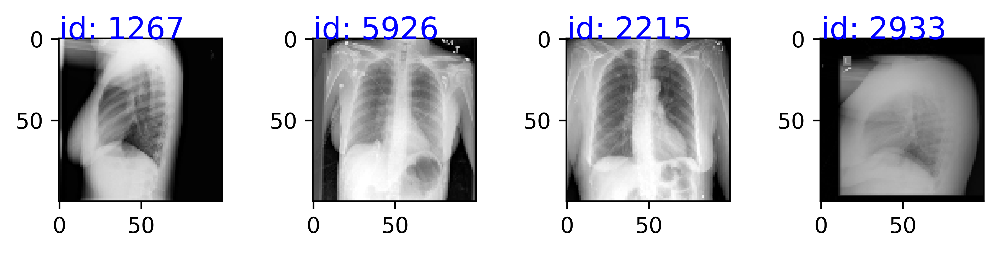

id: 1267
comparison none available indication xxxx-year-old female dyspnea findings heart size normal pneumothorax pleural effusion focal airspace disease bony structures appear intact impression acute cardiopulmonary abnormality 
id: 5926
comparison portable chest xxxx indication xxxx-year-old female chest pain findings heart size within normal limits focal airspace disease pneumothorax pleural effusion impression acute cardiopulmonary findings 
id: 2215
indication colorectal mass evaluate lung mass findings heart normal size mediastinum stable calcified right paratracheal lymph xxxx seen aorta atherosclerotic lungs mildly hypoinflated without focal consolidation pleural effusion impression acute disease 
id: 2933
comparison none indication left sided chest pain findings lungs appear clear heart pulmonary xxxx normal pleural spaces clear mediastinal contours normal impression acute acute cardiopulmonary disease 
Samples from Validation
[  39 6979 3506 3377]


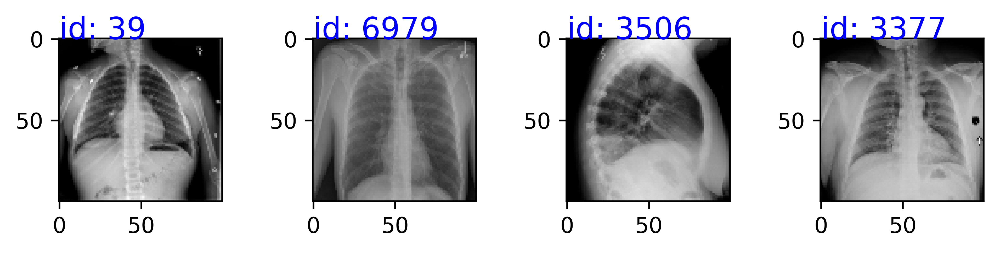

id: 39
comparison none indication left chest pain impression heart size mediastinal silhouette vascularity normal lobar consolidation pleural effusion pneumothorax approximately cm right middle lobe nodular opacity xxxx showing benign type calcification consider followup xxxx chest characterization 
id: 6979
comparison two-view chest radiograph dated xxxx xxxx indication xxxx-year-old xxxx chest pain findings lungs clear bilaterally specifically evidence focal consolidation pneumothorax pleural effusion cardio mediastinal silhouette unremarkable visualized osseous structures thorax without acute abnormality impression stable chest without acute cardiopulmonary abnormality 
id: 3506
comparison xxxx xxxx indication left chest tube removal impression heart size normal significant change left base airspace disease small effusion small residual right pneumothorax increased right base atelectasis catheter overlying right mediastinum may outside patient 
id: 3377
comparison none indication ch

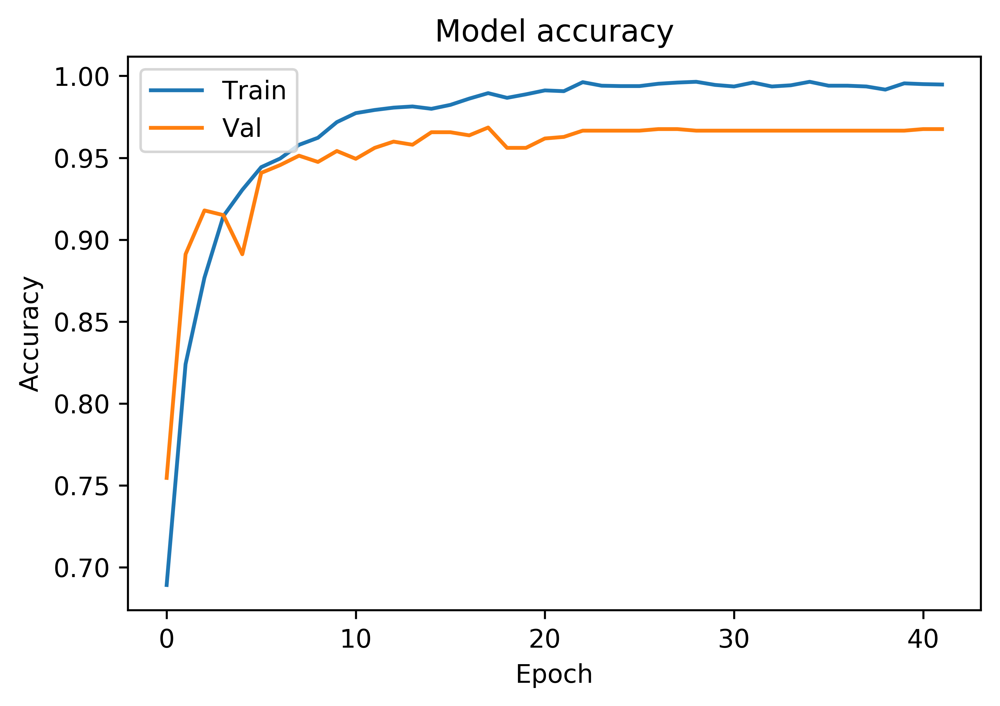

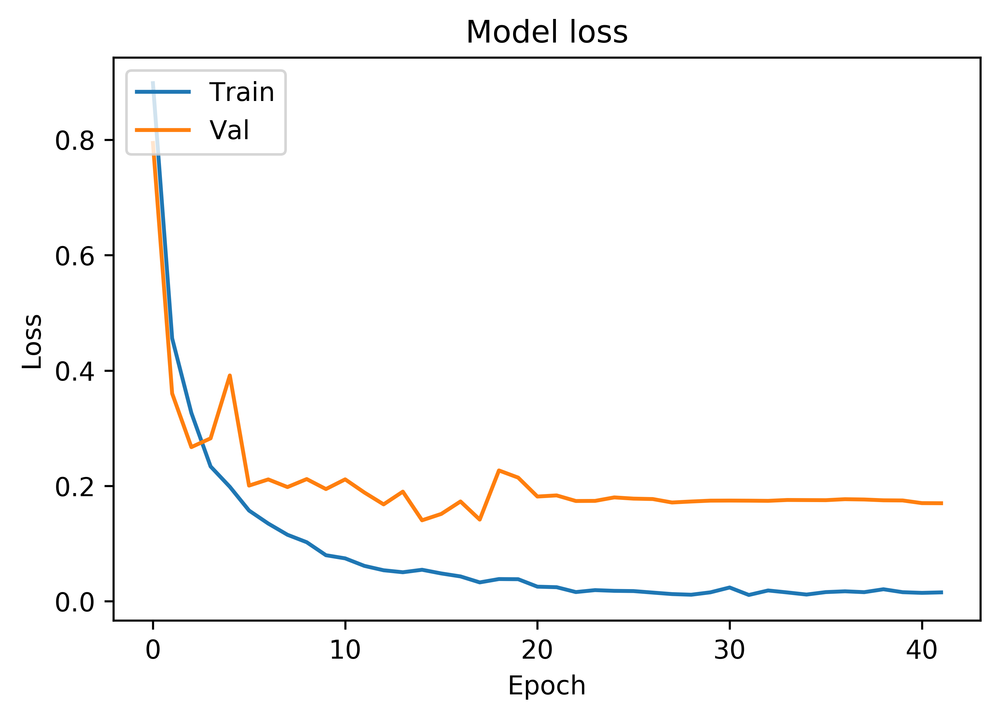

Results from K-fold: 1
acc: 96.75%
1047/1047 [==============================] - 1s 710us/step
[0.169965290126445, 0.9675262657482508]
          normal  abnormal
normal       645        24
abnormal      10       368
              precision    recall  f1-score   support

      normal       0.98      0.96      0.97       669
    abnormal       0.94      0.97      0.96       378

   micro avg       0.97      0.97      0.97      1047
   macro avg       0.96      0.97      0.97      1047
weighted avg       0.97      0.97      0.97      1047

fold_2
K-: fold_2
Samples from Training
[6945 4672 2690 2928]


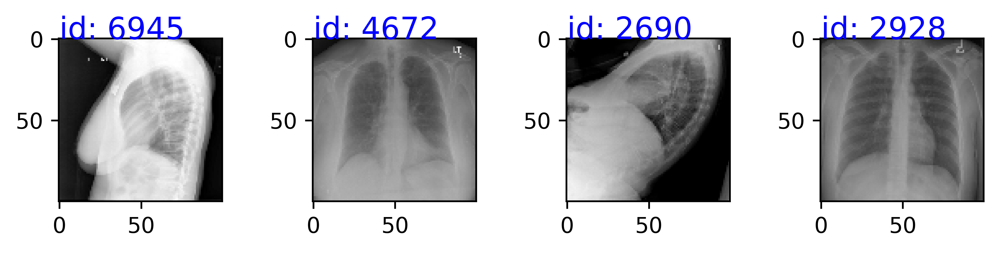

id: 6945
comparison none indication xxxx yr old female dyspnea findings left chest wall mediport placement venous catheter tip superior xxxx xxxx normal cardiac contours pneumothorax pleural effusions clear lungs bilaterally xxxx fracture seen l areas sclerosis throughout thoracic lumbar spine impression pathologic fractures seen l left venous catheter svc 
id: 4672
comparison radiographs chest xxxx xxxx indication shortness breath findings streaky opacity noted within left lung base may represent focal area atelectasis right lung grossly clear cardiac silhouette mediastinal contours within normal limits pneumothorax large pleural effusion impression left lower lobe atelectasis otherwise acute cardiopulmonary disease 
id: 2690
comparison none indication allergic reaction findings cardiomediastinal silhouette normal size configuration atherosclerotic calcification thoracic aorta pulmonary vasculature within normal limits lungs well-aerated pneumothorax pleural effusion focal consolidati

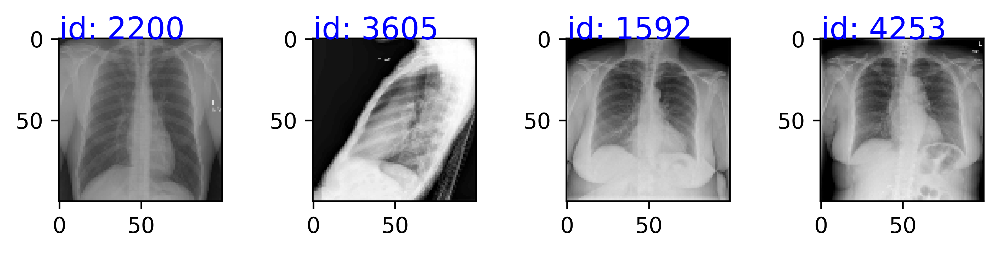

id: 2200
comparison none indication chest pain findings lungs clear bilaterally focal consolidation pleural effusion pneumothoraces cardiomediastinal silhouette within normal limits xxxx unremarkable impression acute cardiopulmonary abnormality 
id: 3605
comparison chest x-xxxx xxxx xxxx indication xxxx-year-old male cachectic hiv patient findings normal heart size mediastinal contours focal airspace consolidation xxxx opacities right lower lung representing atelectasis versus scarring significantly decreased subcutaneous soft tissue since comparison radiograph probable pectus deformity negative acute bony abnormality impression acute cardiopulmonary abnormality hyperlucent lungs xxxx related cachexia probable pectus excavatum deformity 
id: 1592
comparison single ap chest radiograph dated xxxx xxxx indication xxxx-year-old woman wheezing dyspnea findings compared prior examination xxxx stent removed cardiomediastinal silhouette stable within normal limits stable mild atherosclerotic c

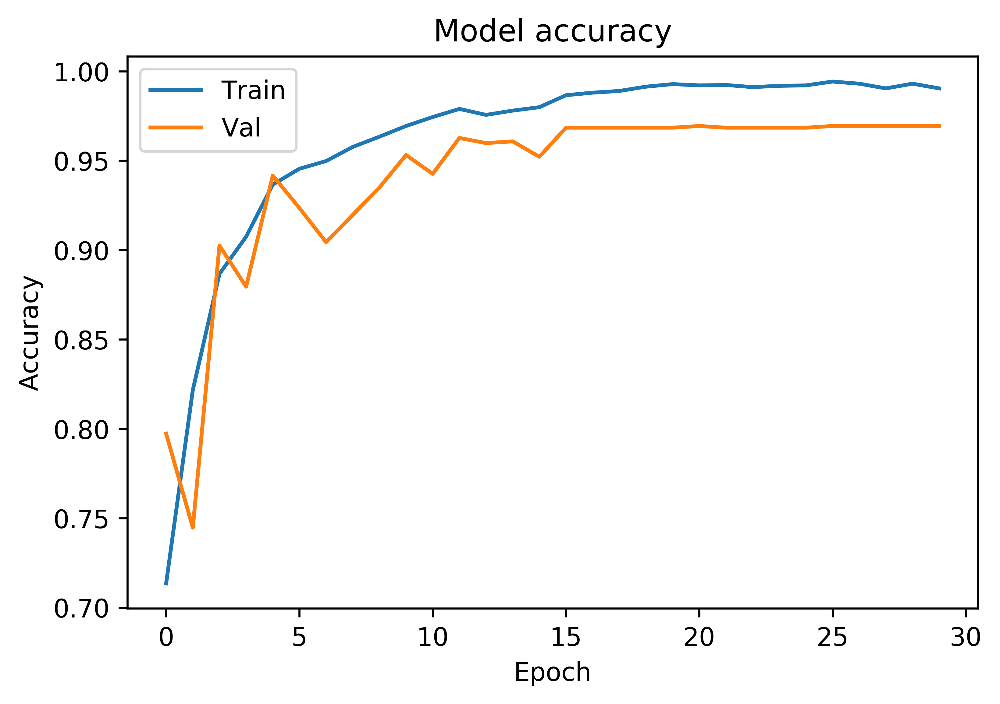

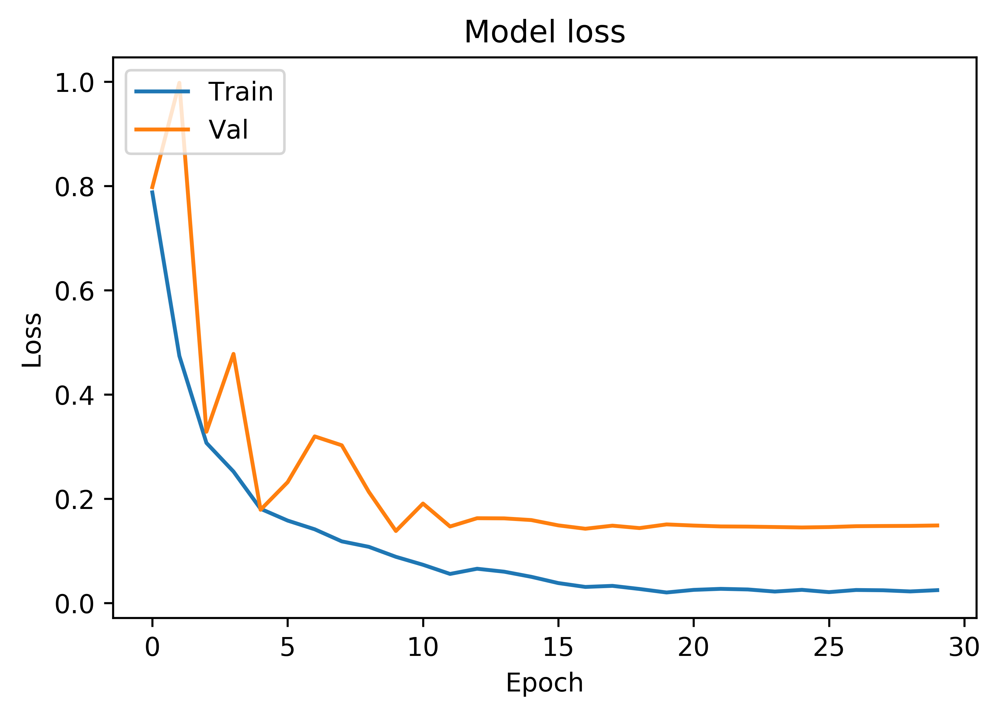

Results from K-fold: 2
acc: 96.94%
1046/1046 [==============================] - 1s 780us/step
[0.1486385279650271, 0.9694072663442127]
          normal  abnormal
normal       648        20
abnormal      12       366
              precision    recall  f1-score   support

      normal       0.98      0.97      0.98       668
    abnormal       0.95      0.97      0.96       378

   micro avg       0.97      0.97      0.97      1046
   macro avg       0.97      0.97      0.97      1046
weighted avg       0.97      0.97      0.97      1046

fold_3
K-: fold_3
Samples from Training
[1892 2643 6303 1168]


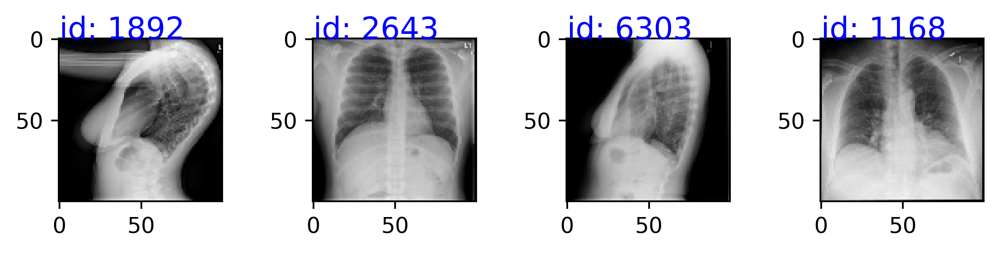

id: 1892
comparison none indication chest pain shortness breath findings lungs pleural spaces show acute abnormality heart size pulmonary vascularity within normal limits impression acute pulmonary abnormality 
id: 2643
indication chest pain impression heart size normal lungs clear 
id: 6303
comparison none indication history smoking status post left upper lobectomy impression heart size normal lungs clear calcified mm granuloma left midlung status post resection left upper lobe adenopathy nodules masses effusion 
id: 1168
comparison none indication sob findings trachea midline heart xxxx slightly large low lung volumes causing bronchovascular crowding otherwise lungs appear clear without evidence acute infiltrate effusion pneumothorax visualized bony structures reveal acute abnormalities impression acute cardiopulmonary abnormalities 
Samples from Validation
[4229 3925 5427 6301]


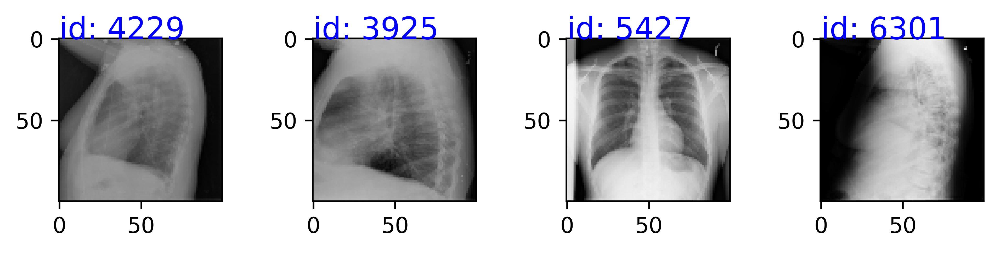

id: 4229
indication history chest pain impression status post left mastectomy heart size normal lungs clear 
id: 3925
comparison chest radiograph xxxx indication xxxx-year-old xxxx chest pain findings acute osseous abnormalities soft tissues within normal limits stable enlargement heart calcific aorta stable bilateral calcified granulomas lungs clear bilaterally without focal area consolidation pleural effusion pneumothorax impression acute radiographic cardiopulmonary process 
id: 5427
comparison none indication chest pain shortness breath xxxx dizziness findings images heart size pulmonary vascular engorgement appear within limits normal mediastinal contour unremarkable focal consolidation pleural effusion pneumothorax identified convincing acute bony findings impression acute cardiopulmonary abnormality identified 
id: 6301
comparison portable chest dated xxxx indication xxxx-year-old male shortness breath findings bilateral patchy pulmonary opacities noted interval improvement left

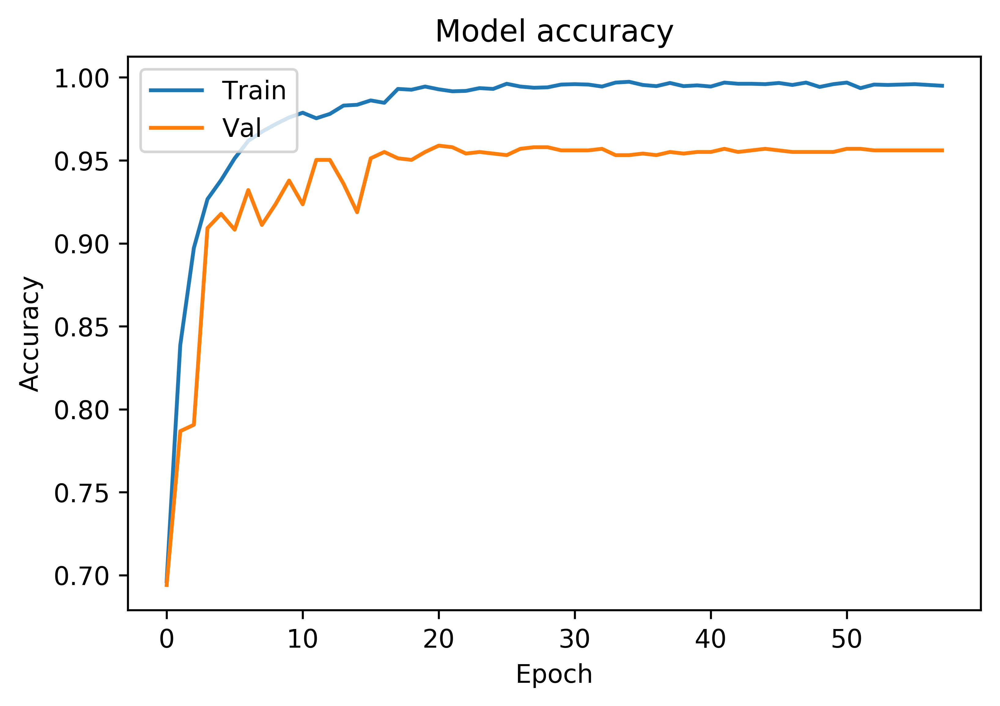

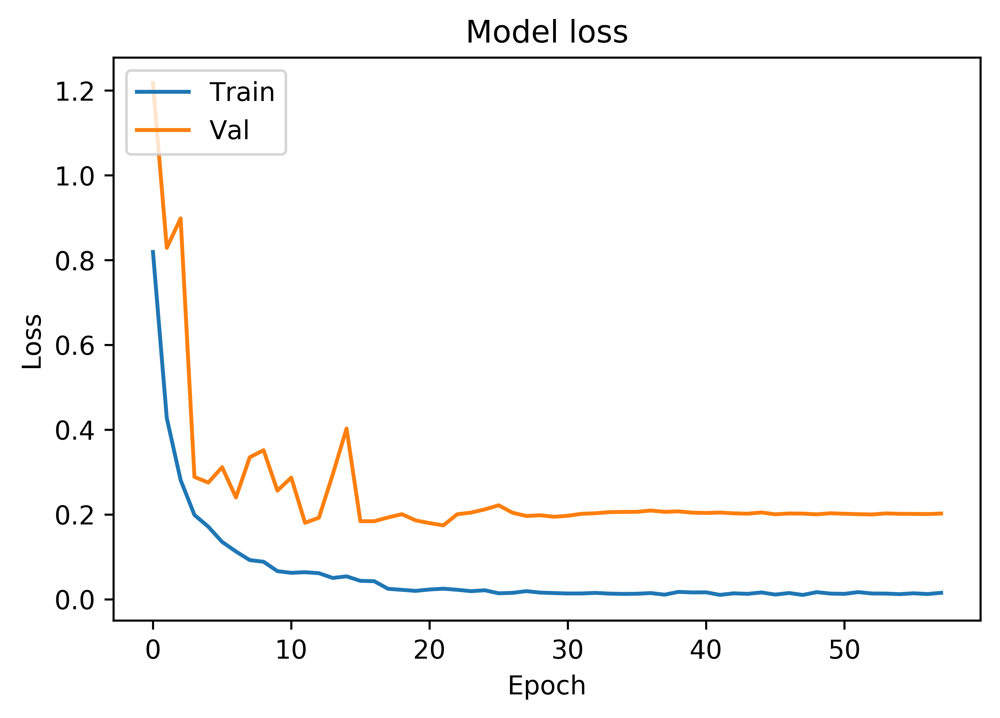

Results from K-fold: 3
acc: 95.60%
1046/1046 [==============================] - 1s 767us/step
[0.20204578018809596, 0.9560229451205033]
          normal  abnormal
normal       633        35
abnormal      11       367
              precision    recall  f1-score   support

      normal       0.98      0.95      0.96       668
    abnormal       0.91      0.97      0.94       378

   micro avg       0.96      0.96      0.96      1046
   macro avg       0.95      0.96      0.95      1046
weighted avg       0.96      0.96      0.96      1046

fold_4
K-: fold_4
Samples from Training
[3579  177 3127 5831]


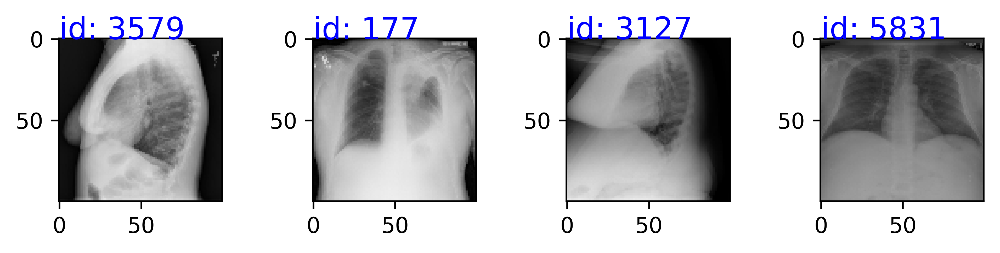

id: 3579
comparison none indication xxxx-year-old female chest pain findings cardiomediastinal silhouettes within normal limits lungs clear without focal consolidation pneumothorax pleural effusion bony thorax unremarkable impression acute cardiopulmonary abnormalities 
id: 177
indication xxxx-year-old male syncopal episode additional information obtained electronic medical record history lung cancer impression mild left costophrenic xxxx blunting xxxx xxxx basilar pleural effusion increased left suprahilar opacity differential diagnosis includes increased volume loss apical pleural fluid tumor progression left hemithorax volume loss leftward shift heart mediastinum xxxx right costophrenic xxxx right lung free focal consolidation 
id: 3127
comparison none indication xxxx-year-old dyspnea preop bariatric studies findings normal heart size clear lungs without pneumothorax pleural effusion impression normal chest exam 
id: 5831
comparison none indication xxxx-year-old male chronic kidney 

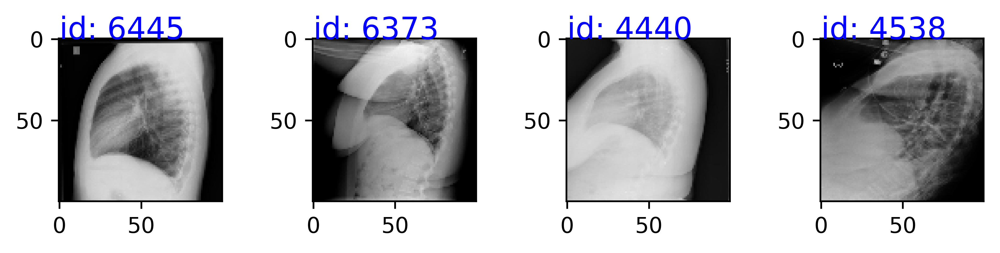

id: 6445
comparison none indication chest pain findings cardiac mediastinal contours within normal limits lungs clear bony structures intact impression negative chest x-xxxx 
id: 6373
comparison none indication back pain findings heart size mediastinal contour normal pulmonary vascularity normal lungs clear pleural effusions pneumothoraces impression acute cardiopulmonary process 
id: 4440
comparison xxxx xxxx indication xxxx-year-old female shortness breath findings cardiomediastinal silhouette normal size contour focal consolidation pneumothorax large pleural effusion normal xxxx impression negative acute abnormality 
id: 4538
indication xxxx-year-old female status post chest tube removal findings stable cardiomediastinal silhouette interval removal right chest tube increased elevation right hemidiaphragm xxxx right basilar atelectasis left basilar consolidation pleural effusions seen xxxx focal consolidation pneumothorax stable left picc tip overlying mid svc large xxxx feeding tube

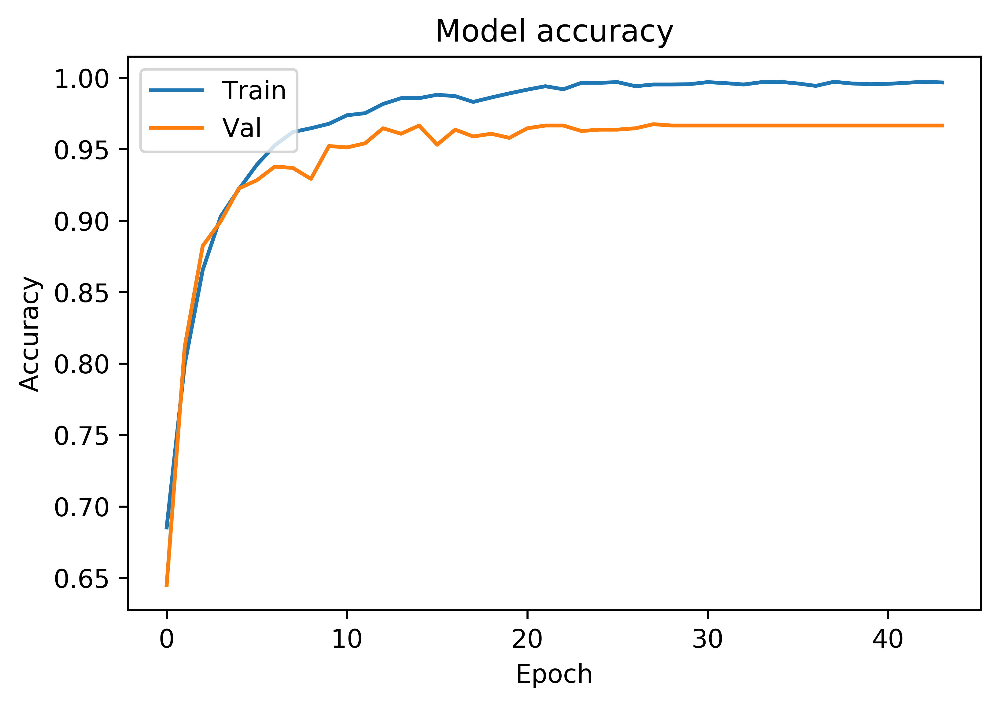

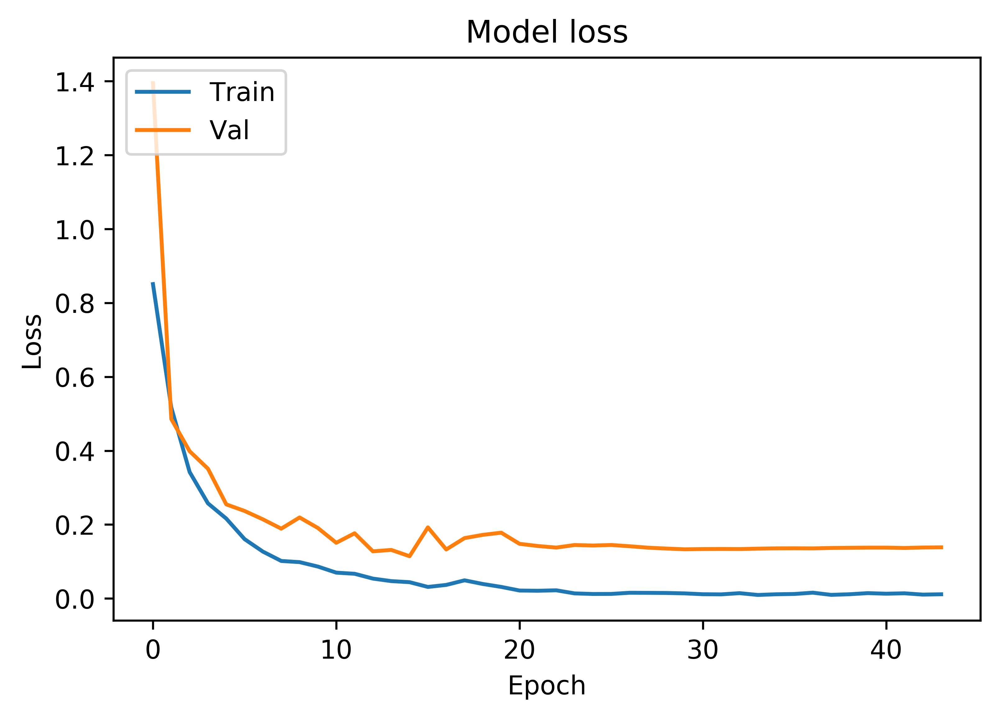

Results from K-fold: 4
acc: 96.65%
1045/1045 [==============================] - 1s 808us/step
[0.1383604325942303, 0.9665071770905308]
          normal  abnormal
normal       646        22
abnormal      13       364
              precision    recall  f1-score   support

      normal       0.98      0.97      0.97       668
    abnormal       0.94      0.97      0.95       377

   micro avg       0.97      0.97      0.97      1045
   macro avg       0.96      0.97      0.96      1045
weighted avg       0.97      0.97      0.97      1045

fold_5
K-: fold_5
Samples from Training
[5822 5097 4853 3579]


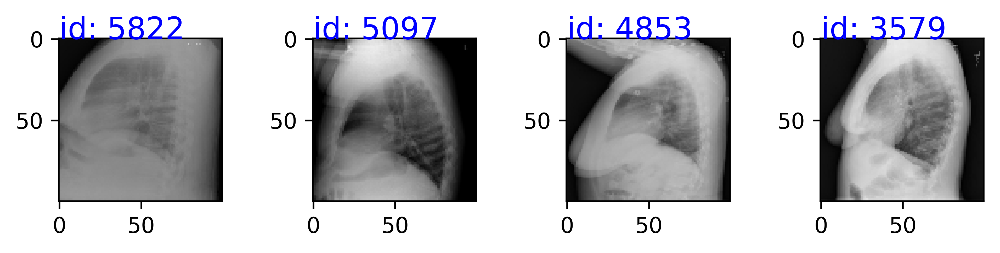

id: 5822
comparison none available indication xxxx-year-old male shortness breath findings heart size mediastinal contours appear within normal limits focal airspace consolidation pleural effusion pneumothorax acute bony abnormalities impression acute cardiopulmonary findings 
id: 5097
comparison none available indication left-sided chest pain findings heart size mildly enlarged tortuous aorta lung volumes low central bronchovascular crowding patchy basilar atelectasis degenerative changes spine impression low volume study without acute process mild cardiomegaly 
id: 4853
comparison xxxx indication chest pain findings heart enlarged aorta tortuous lungs hypoinflated clear pleural effusion pneumothorax seen impression stable cardiomegaly without acute disease 
id: 3579
comparison none indication xxxx-year-old female chest pain findings cardiomediastinal silhouettes within normal limits lungs clear without focal consolidation pneumothorax pleural effusion bony thorax unremarkable impress

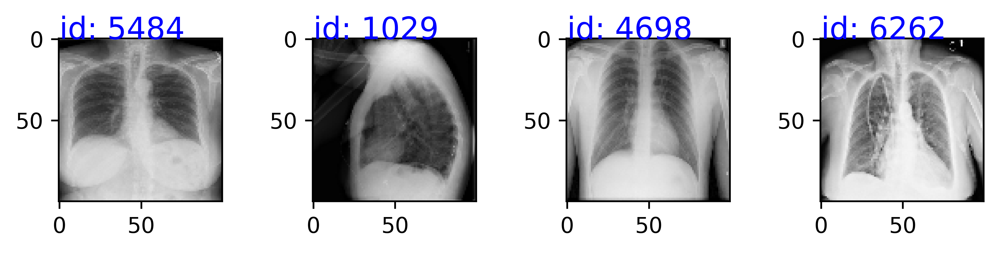

id: 5484
comparison xxxx indication chronic xxxx xxxx findings lungs overall hyperexpanded flattening diaphragms focal consolidation pleural effusions pneumothoraces heart mediastinum normal size contour degenerative changes thoracic spine impression hyperexpanded clear lungs 
id: 1029
comparison xxxx xxxx indication xxxx rule pneumothorax findings cardiomediastinal silhouette pulmonary vasculature within normal limits size thin right apical pneumothorax measuring approximately mm thickness extensive subcutaneous emphysema right chest wall neck fractures right anterior th th anterior ribs mild displacement additional fractures cannot entirely excluded mild streaky airspace disease right lung base left lung clear small hiatal hernia intrathecal catheter terminating lower thoracic spine impression xxxx right apical pneumothorax measuring approximately mm thickness multiple right-sided rib fractures involving xxxx right anterior th th ribs mild displacement mild right basilar airspace dis

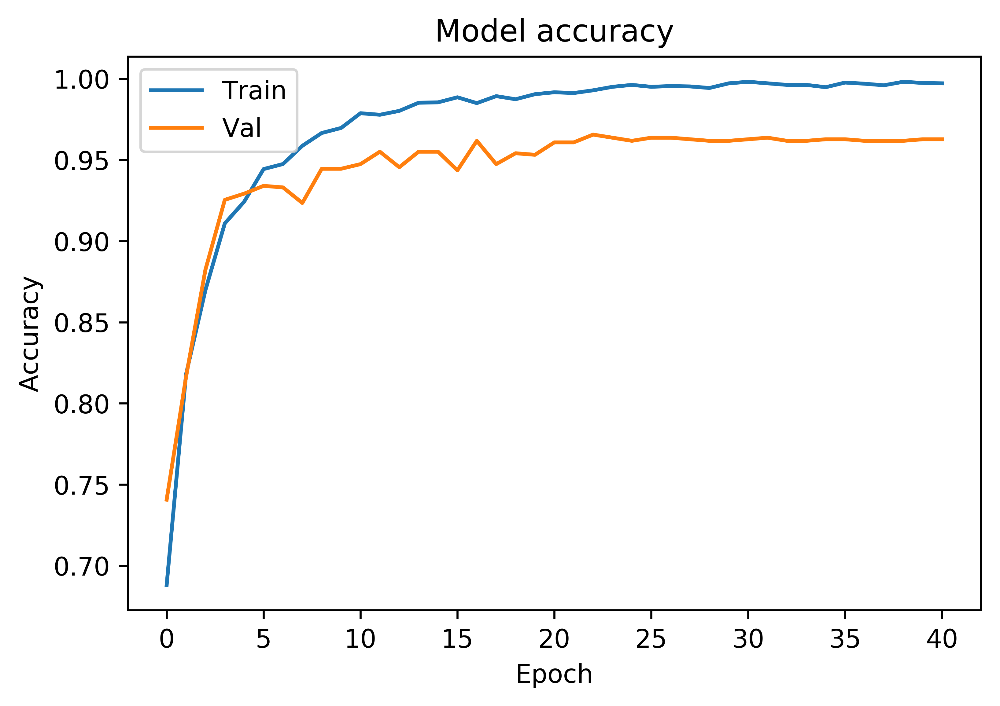

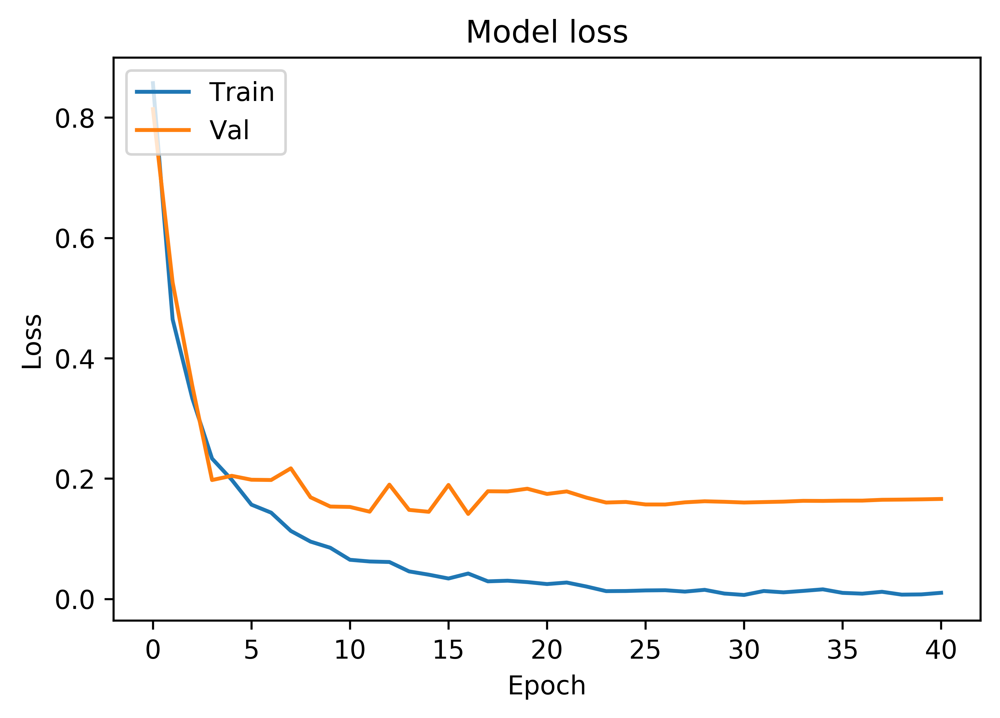

Results from K-fold: 5
acc: 96.27%
1045/1045 [==============================] - 1s 801us/step
[0.16617209138081332, 0.9626794258373206]
          normal  abnormal
normal       645        23
abnormal      16       361
              precision    recall  f1-score   support

      normal       0.98      0.97      0.97       668
    abnormal       0.94      0.96      0.95       377

   micro avg       0.96      0.96      0.96      1045
   macro avg       0.96      0.96      0.96      1045
weighted avg       0.96      0.96      0.96      1045

Average for kfold accuracy and stdev
96.44% (+/- 0.47%)
Average classification report for all folds
              precision  recall  f1_score  support
class                                             
abnormal          0.936   0.968     0.952    377.6
macro_avg         0.960   0.966     0.962   1045.8
micro_avg         0.966   0.966     0.966   1045.8
normal            0.980   0.964     0.970    668.2
weighted_avg      0.966   0.966     0.966   1045.8

In [12]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for key, kfold in kfolds.items():
    print(key)
    train = kfold['train']
    val = kfold['valid']
    
    print('K-: {}'.format(key))
        
    print("Samples from Training")
    print_samples(samples=train, images=X_image, text=X_text, tokenizer=tokenizer)
    print("============================")
    
    print("Samples from Validation")
    print_samples(samples=val, images=X_image, text=X_text, tokenizer=tokenizer)
    print("============================")
    
    text_image_model = Generate_Model(model_type='multimodal')
    text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="model_fusion_weights/best_weight_image_text_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_image_model.fit([X_text[train], X_image[train]], y[train], 
                     epochs=epochs, batch_size=bs, validation_data=([X_text[val], X_image[val]], y[val]), callbacks=callbacks_list)
    plot_model_history(history)
    filepath="model_fusion_weights/final_weight_image_text_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[val], X_image[val]], y[val], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[val], X_image[val], y[val]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[val]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    cr = classification_report([np.argmax(t) for t in y[val]], y_hat, target_names=class_names)
    report_list.append(classification_report_df(cr))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))
print("Average classification report for all folds")
print(df_mean(report_list))

In [13]:
reduce_lr_final = ReduceLROnPlateau(monitor='loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
text_image_model = Generate_Model(model_type = 'multimodal')
text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
filepath="model_fusion_weights/best_weight_image_text_final.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr_final, checkpoint, early_stopping]

history = text_image_model.fit([X_text[final_train], X_image[final_train]], y[final_train], 
                 epochs=epochs, batch_size=bs, validation_data=None, callbacks=callbacks_list)
filepath="model_fusion_weights/best_weight_image_text_final.hdf5"
text_image_model.save_weights(filepath)
print('========================TEST MODEL=======================')
scores = text_image_model.evaluate([X_text[final_test], X_image[final_test]], y[final_test], verbose=0)
print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
y_hat = test_model(text_image_model, zip(X_text[final_test], X_image[final_test], y[final_test]), image = True, text = True, 
                   class_names=class_names)

[INFO] training with 2 GPUs...
Epoch 1/150
5229/5229 [==============================] - 16s 3ms/step - loss: 0.8284 - acc: 0.6881

Epoch 00001: acc improved from -inf to 0.68809, saving model to model_fusion_weights/best_weight_image_text_final.hdf5
Epoch 2/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.4337 - acc: 0.8264

Epoch 00002: acc improved from 0.68809 to 0.82635, saving model to model_fusion_weights/best_weight_image_text_final.hdf5
Epoch 3/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.2848 - acc: 0.8931

Epoch 00003: acc improved from 0.82635 to 0.89310, saving model to model_fusion_weights/best_weight_image_text_final.hdf5
Epoch 4/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.2202 - acc: 0.9203

Epoch 00004: acc improved from 0.89310 to 0.92025, saving model to model_fusion_weights/best_weight_image_text_final.hdf5
Epoch 5/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.1808 - a

### Inspect images

blue = ground truth, red = prediction


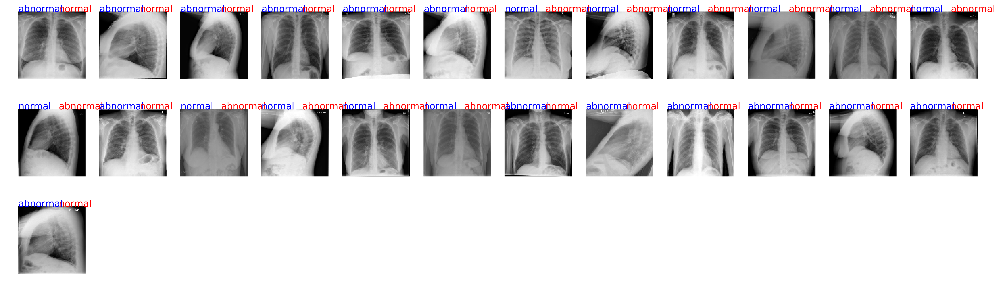

In [14]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[final_test] ]
test_wrong = [im for im in zip(X_image[final_test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

### K-Fold validation Multimodal: Train text and images - Pretrained Weights

fold_1
K-: fold_1
Samples from Training
[1267 5926 2215 2933]


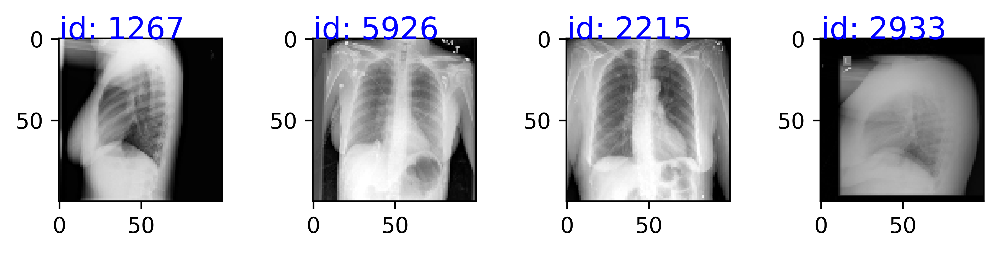

id: 1267
comparison none available indication xxxx-year-old female dyspnea findings heart size normal pneumothorax pleural effusion focal airspace disease bony structures appear intact impression acute cardiopulmonary abnormality 
id: 5926
comparison portable chest xxxx indication xxxx-year-old female chest pain findings heart size within normal limits focal airspace disease pneumothorax pleural effusion impression acute cardiopulmonary findings 
id: 2215
indication colorectal mass evaluate lung mass findings heart normal size mediastinum stable calcified right paratracheal lymph xxxx seen aorta atherosclerotic lungs mildly hypoinflated without focal consolidation pleural effusion impression acute disease 
id: 2933
comparison none indication left sided chest pain findings lungs appear clear heart pulmonary xxxx normal pleural spaces clear mediastinal contours normal impression acute acute cardiopulmonary disease 
Samples from Validation
[  39 6979 3506 3377]


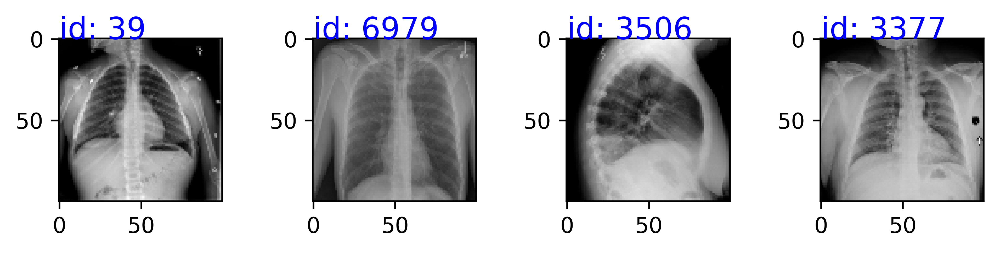

id: 39
comparison none indication left chest pain impression heart size mediastinal silhouette vascularity normal lobar consolidation pleural effusion pneumothorax approximately cm right middle lobe nodular opacity xxxx showing benign type calcification consider followup xxxx chest characterization 
id: 6979
comparison two-view chest radiograph dated xxxx xxxx indication xxxx-year-old xxxx chest pain findings lungs clear bilaterally specifically evidence focal consolidation pneumothorax pleural effusion cardio mediastinal silhouette unremarkable visualized osseous structures thorax without acute abnormality impression stable chest without acute cardiopulmonary abnormality 
id: 3506
comparison xxxx xxxx indication left chest tube removal impression heart size normal significant change left base airspace disease small effusion small residual right pneumothorax increased right base atelectasis catheter overlying right mediastinum may outside patient 
id: 3377
comparison none indication ch

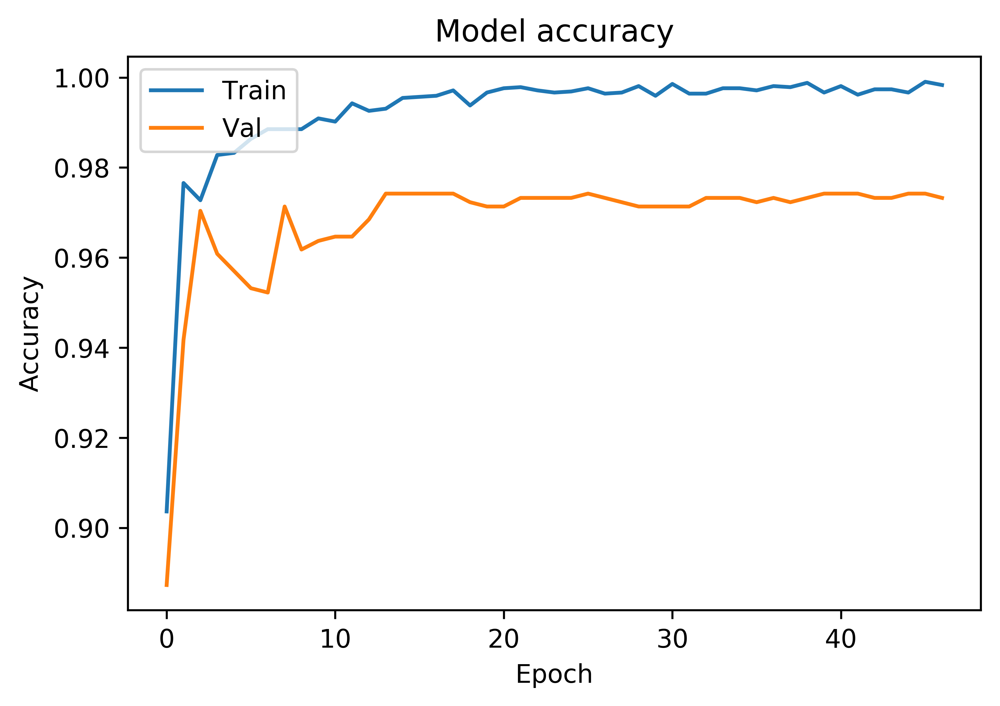

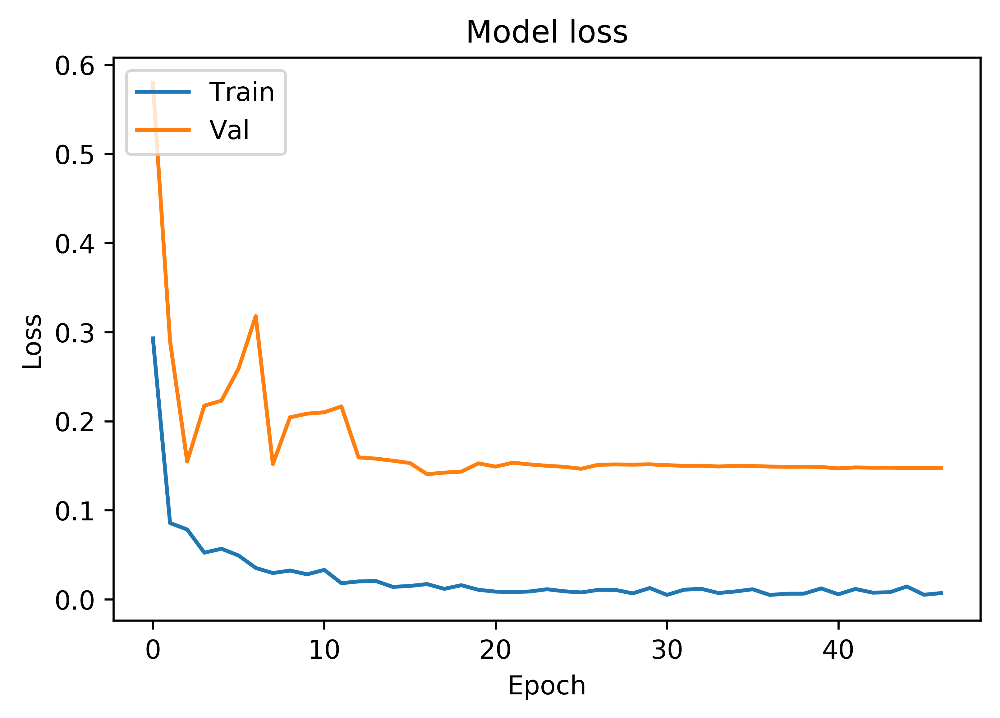

Results from K-fold: 1
acc: 97.33%
1047/1047 [==============================] - 1s 780us/step
[0.14759030397767922, 0.9732569247740388]
          normal  abnormal
normal       655        14
abnormal      14       364
              precision    recall  f1-score   support

      normal       0.98      0.98      0.98       669
    abnormal       0.96      0.96      0.96       378

   micro avg       0.97      0.97      0.97      1047
   macro avg       0.97      0.97      0.97      1047
weighted avg       0.97      0.97      0.97      1047

fold_2
K-: fold_2
Samples from Training
[6945 4672 2690 2928]


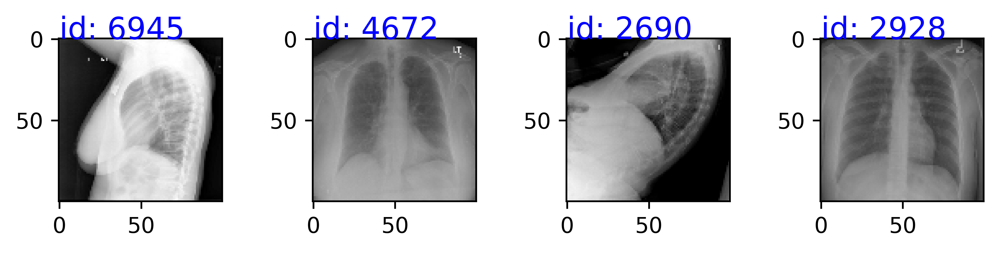

id: 6945
comparison none indication xxxx yr old female dyspnea findings left chest wall mediport placement venous catheter tip superior xxxx xxxx normal cardiac contours pneumothorax pleural effusions clear lungs bilaterally xxxx fracture seen l areas sclerosis throughout thoracic lumbar spine impression pathologic fractures seen l left venous catheter svc 
id: 4672
comparison radiographs chest xxxx xxxx indication shortness breath findings streaky opacity noted within left lung base may represent focal area atelectasis right lung grossly clear cardiac silhouette mediastinal contours within normal limits pneumothorax large pleural effusion impression left lower lobe atelectasis otherwise acute cardiopulmonary disease 
id: 2690
comparison none indication allergic reaction findings cardiomediastinal silhouette normal size configuration atherosclerotic calcification thoracic aorta pulmonary vasculature within normal limits lungs well-aerated pneumothorax pleural effusion focal consolidati

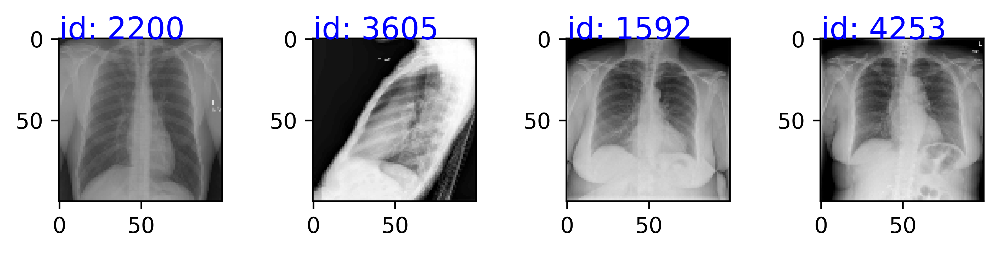

id: 2200
comparison none indication chest pain findings lungs clear bilaterally focal consolidation pleural effusion pneumothoraces cardiomediastinal silhouette within normal limits xxxx unremarkable impression acute cardiopulmonary abnormality 
id: 3605
comparison chest x-xxxx xxxx xxxx indication xxxx-year-old male cachectic hiv patient findings normal heart size mediastinal contours focal airspace consolidation xxxx opacities right lower lung representing atelectasis versus scarring significantly decreased subcutaneous soft tissue since comparison radiograph probable pectus deformity negative acute bony abnormality impression acute cardiopulmonary abnormality hyperlucent lungs xxxx related cachexia probable pectus excavatum deformity 
id: 1592
comparison single ap chest radiograph dated xxxx xxxx indication xxxx-year-old woman wheezing dyspnea findings compared prior examination xxxx stent removed cardiomediastinal silhouette stable within normal limits stable mild atherosclerotic c

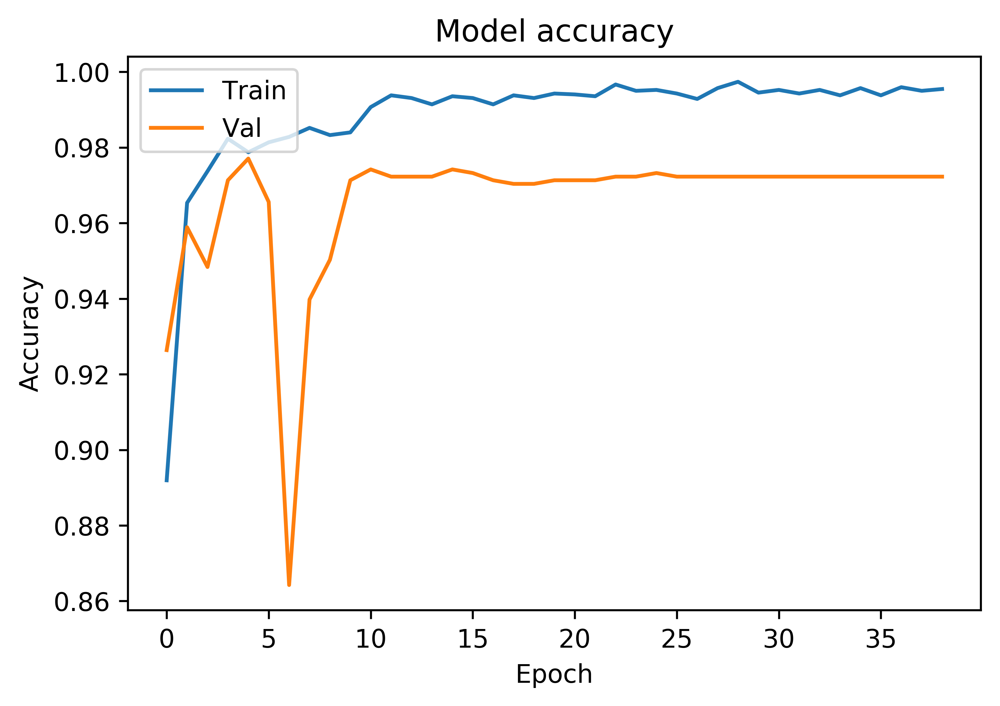

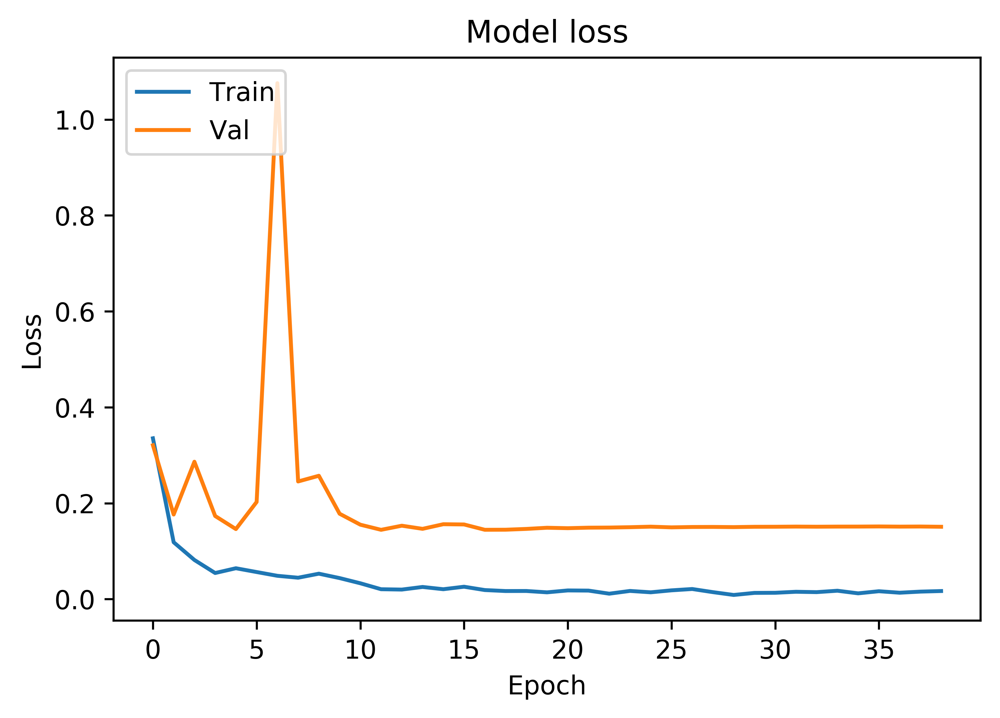

Results from K-fold: 2
acc: 97.23%
1046/1046 [==============================] - 1s 721us/step
[0.1509196583616118, 0.9722753342661301]
          normal  abnormal
normal       652        16
abnormal      13       365
              precision    recall  f1-score   support

      normal       0.98      0.98      0.98       668
    abnormal       0.96      0.97      0.96       378

   micro avg       0.97      0.97      0.97      1046
   macro avg       0.97      0.97      0.97      1046
weighted avg       0.97      0.97      0.97      1046

fold_3
K-: fold_3
Samples from Training
[1892 2643 6303 1168]


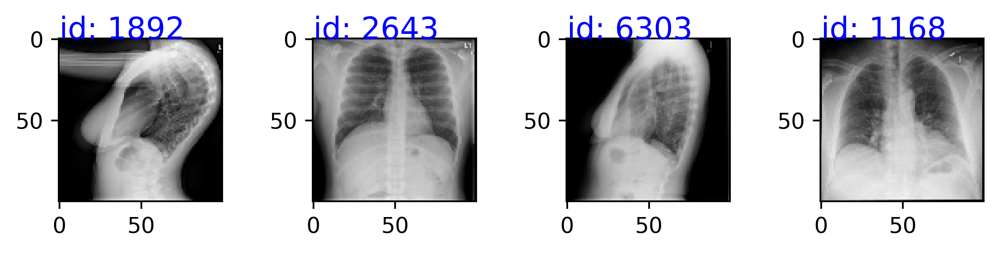

id: 1892
comparison none indication chest pain shortness breath findings lungs pleural spaces show acute abnormality heart size pulmonary vascularity within normal limits impression acute pulmonary abnormality 
id: 2643
indication chest pain impression heart size normal lungs clear 
id: 6303
comparison none indication history smoking status post left upper lobectomy impression heart size normal lungs clear calcified mm granuloma left midlung status post resection left upper lobe adenopathy nodules masses effusion 
id: 1168
comparison none indication sob findings trachea midline heart xxxx slightly large low lung volumes causing bronchovascular crowding otherwise lungs appear clear without evidence acute infiltrate effusion pneumothorax visualized bony structures reveal acute abnormalities impression acute cardiopulmonary abnormalities 
Samples from Validation
[4229 3925 5427 6301]


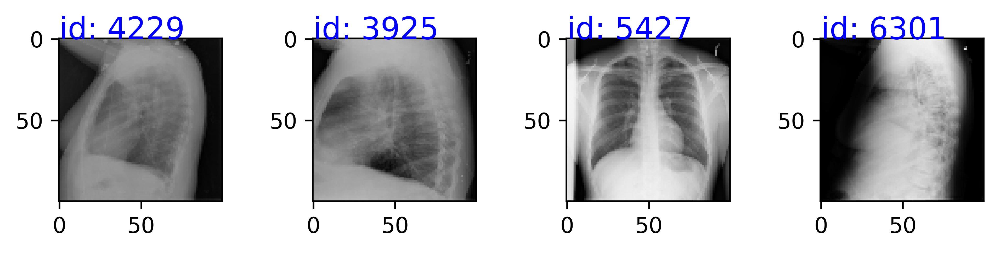

id: 4229
indication history chest pain impression status post left mastectomy heart size normal lungs clear 
id: 3925
comparison chest radiograph xxxx indication xxxx-year-old xxxx chest pain findings acute osseous abnormalities soft tissues within normal limits stable enlargement heart calcific aorta stable bilateral calcified granulomas lungs clear bilaterally without focal area consolidation pleural effusion pneumothorax impression acute radiographic cardiopulmonary process 
id: 5427
comparison none indication chest pain shortness breath xxxx dizziness findings images heart size pulmonary vascular engorgement appear within limits normal mediastinal contour unremarkable focal consolidation pleural effusion pneumothorax identified convincing acute bony findings impression acute cardiopulmonary abnormality identified 
id: 6301
comparison portable chest dated xxxx indication xxxx-year-old male shortness breath findings bilateral patchy pulmonary opacities noted interval improvement left

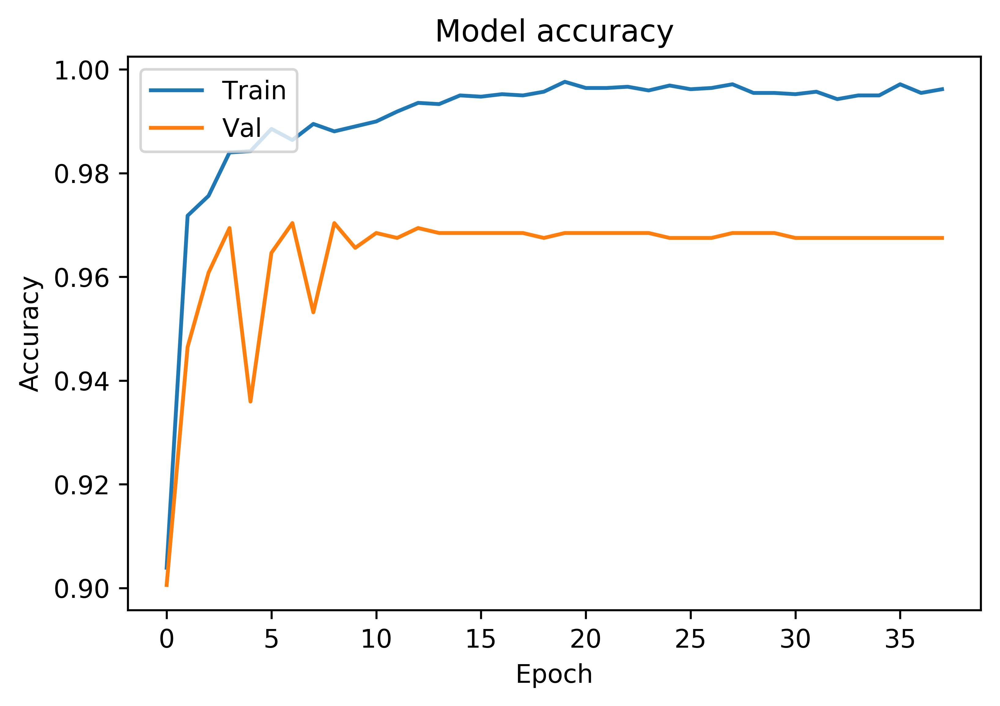

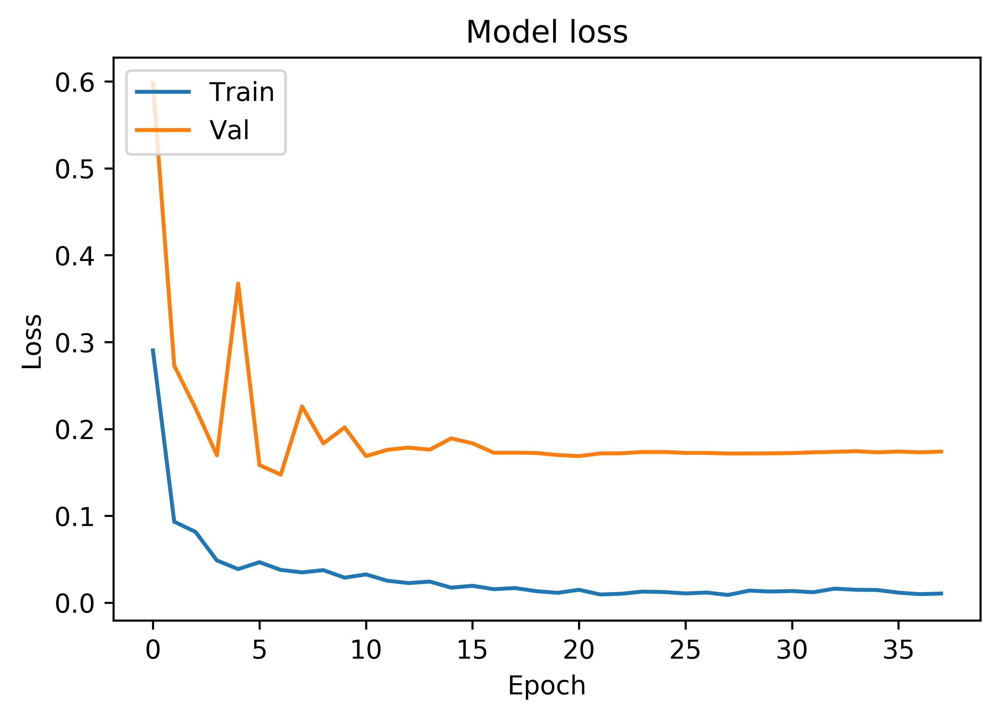

Results from K-fold: 3
acc: 96.75%
1046/1046 [==============================] - 1s 838us/step
[0.17387777083352152, 0.9674952198852772]
          normal  abnormal
normal       649        19
abnormal      15       363
              precision    recall  f1-score   support

      normal       0.98      0.97      0.97       668
    abnormal       0.95      0.96      0.96       378

   micro avg       0.97      0.97      0.97      1046
   macro avg       0.96      0.97      0.96      1046
weighted avg       0.97      0.97      0.97      1046

fold_4
K-: fold_4
Samples from Training
[3579  177 3127 5831]


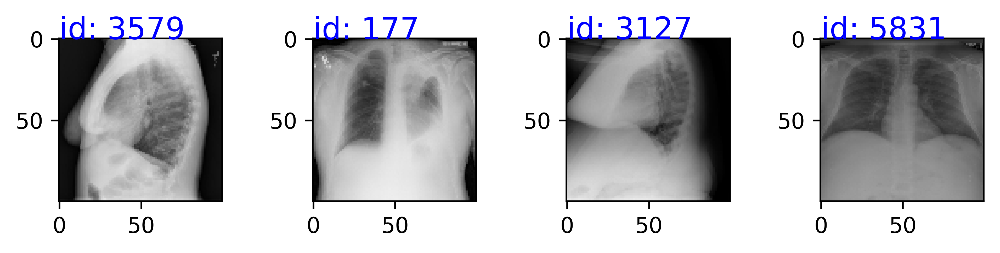

id: 3579
comparison none indication xxxx-year-old female chest pain findings cardiomediastinal silhouettes within normal limits lungs clear without focal consolidation pneumothorax pleural effusion bony thorax unremarkable impression acute cardiopulmonary abnormalities 
id: 177
indication xxxx-year-old male syncopal episode additional information obtained electronic medical record history lung cancer impression mild left costophrenic xxxx blunting xxxx xxxx basilar pleural effusion increased left suprahilar opacity differential diagnosis includes increased volume loss apical pleural fluid tumor progression left hemithorax volume loss leftward shift heart mediastinum xxxx right costophrenic xxxx right lung free focal consolidation 
id: 3127
comparison none indication xxxx-year-old dyspnea preop bariatric studies findings normal heart size clear lungs without pneumothorax pleural effusion impression normal chest exam 
id: 5831
comparison none indication xxxx-year-old male chronic kidney 

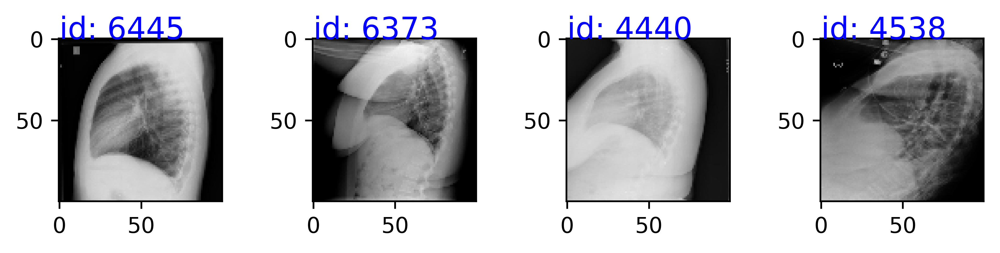

id: 6445
comparison none indication chest pain findings cardiac mediastinal contours within normal limits lungs clear bony structures intact impression negative chest x-xxxx 
id: 6373
comparison none indication back pain findings heart size mediastinal contour normal pulmonary vascularity normal lungs clear pleural effusions pneumothoraces impression acute cardiopulmonary process 
id: 4440
comparison xxxx xxxx indication xxxx-year-old female shortness breath findings cardiomediastinal silhouette normal size contour focal consolidation pneumothorax large pleural effusion normal xxxx impression negative acute abnormality 
id: 4538
indication xxxx-year-old female status post chest tube removal findings stable cardiomediastinal silhouette interval removal right chest tube increased elevation right hemidiaphragm xxxx right basilar atelectasis left basilar consolidation pleural effusions seen xxxx focal consolidation pneumothorax stable left picc tip overlying mid svc large xxxx feeding tube

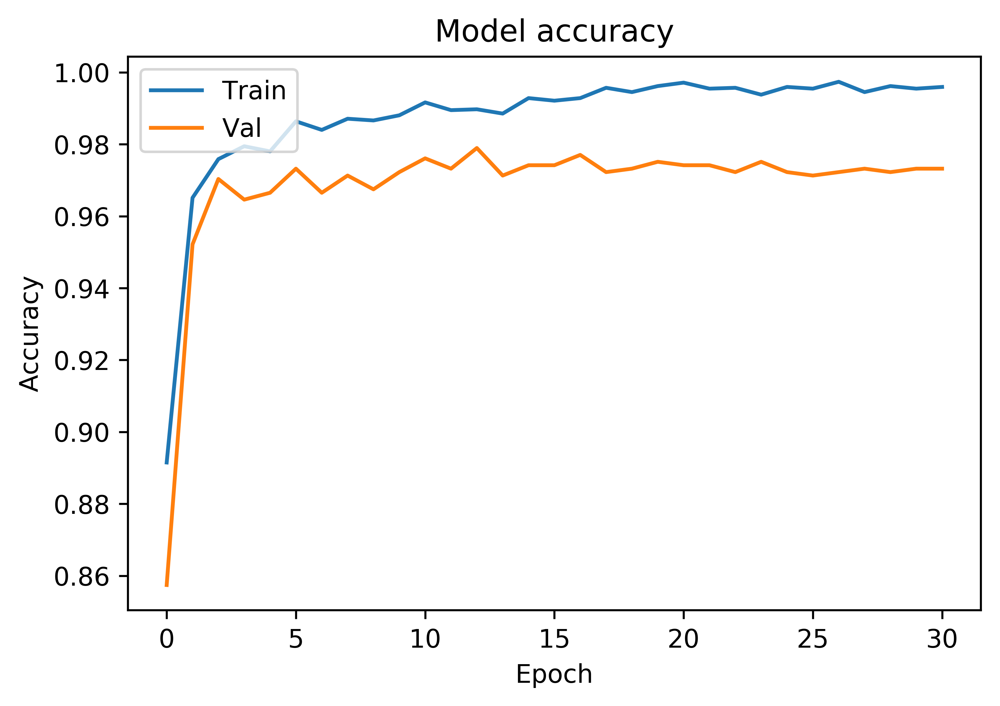

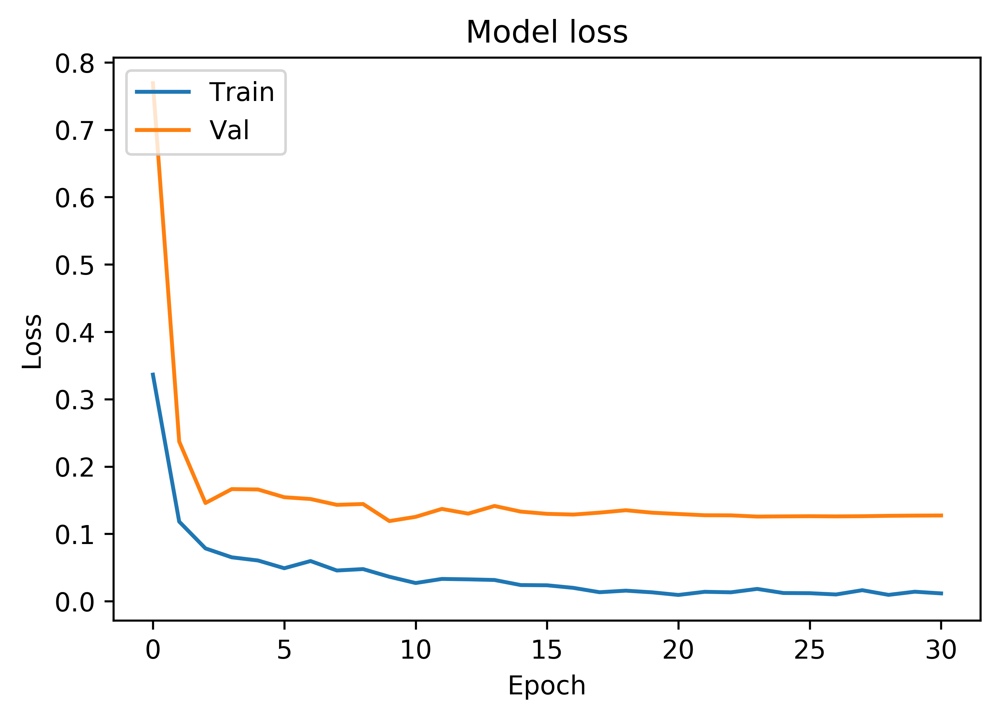

Results from K-fold: 4
acc: 97.32%
1045/1045 [==============================] - 1s 809us/step
[0.12727340381986876, 0.9732057416267943]
          normal  abnormal
normal       652        16
abnormal      12       365
              precision    recall  f1-score   support

      normal       0.98      0.98      0.98       668
    abnormal       0.96      0.97      0.96       377

   micro avg       0.97      0.97      0.97      1045
   macro avg       0.97      0.97      0.97      1045
weighted avg       0.97      0.97      0.97      1045

fold_5
K-: fold_5
Samples from Training
[5822 5097 4853 3579]


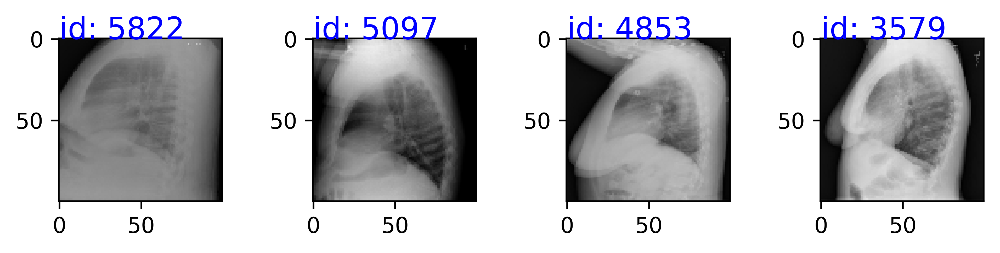

id: 5822
comparison none available indication xxxx-year-old male shortness breath findings heart size mediastinal contours appear within normal limits focal airspace consolidation pleural effusion pneumothorax acute bony abnormalities impression acute cardiopulmonary findings 
id: 5097
comparison none available indication left-sided chest pain findings heart size mildly enlarged tortuous aorta lung volumes low central bronchovascular crowding patchy basilar atelectasis degenerative changes spine impression low volume study without acute process mild cardiomegaly 
id: 4853
comparison xxxx indication chest pain findings heart enlarged aorta tortuous lungs hypoinflated clear pleural effusion pneumothorax seen impression stable cardiomegaly without acute disease 
id: 3579
comparison none indication xxxx-year-old female chest pain findings cardiomediastinal silhouettes within normal limits lungs clear without focal consolidation pneumothorax pleural effusion bony thorax unremarkable impress

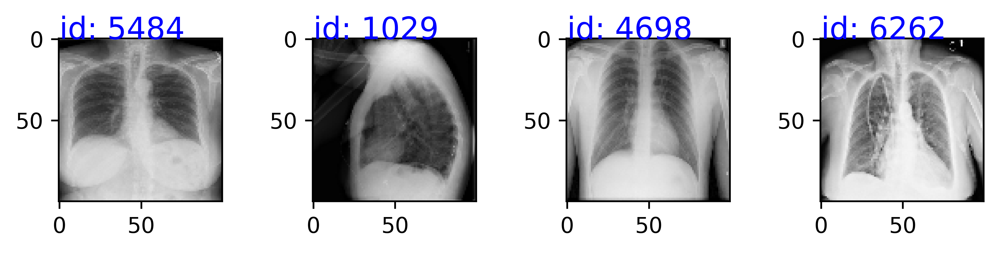

id: 5484
comparison xxxx indication chronic xxxx xxxx findings lungs overall hyperexpanded flattening diaphragms focal consolidation pleural effusions pneumothoraces heart mediastinum normal size contour degenerative changes thoracic spine impression hyperexpanded clear lungs 
id: 1029
comparison xxxx xxxx indication xxxx rule pneumothorax findings cardiomediastinal silhouette pulmonary vasculature within normal limits size thin right apical pneumothorax measuring approximately mm thickness extensive subcutaneous emphysema right chest wall neck fractures right anterior th th anterior ribs mild displacement additional fractures cannot entirely excluded mild streaky airspace disease right lung base left lung clear small hiatal hernia intrathecal catheter terminating lower thoracic spine impression xxxx right apical pneumothorax measuring approximately mm thickness multiple right-sided rib fractures involving xxxx right anterior th th ribs mild displacement mild right basilar airspace dis

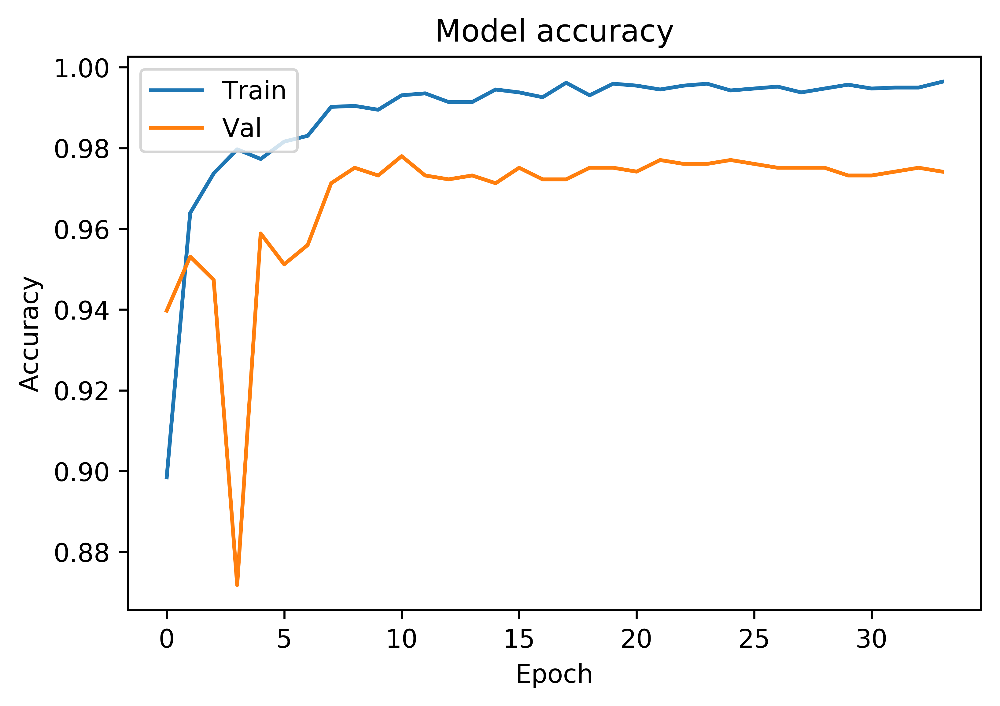

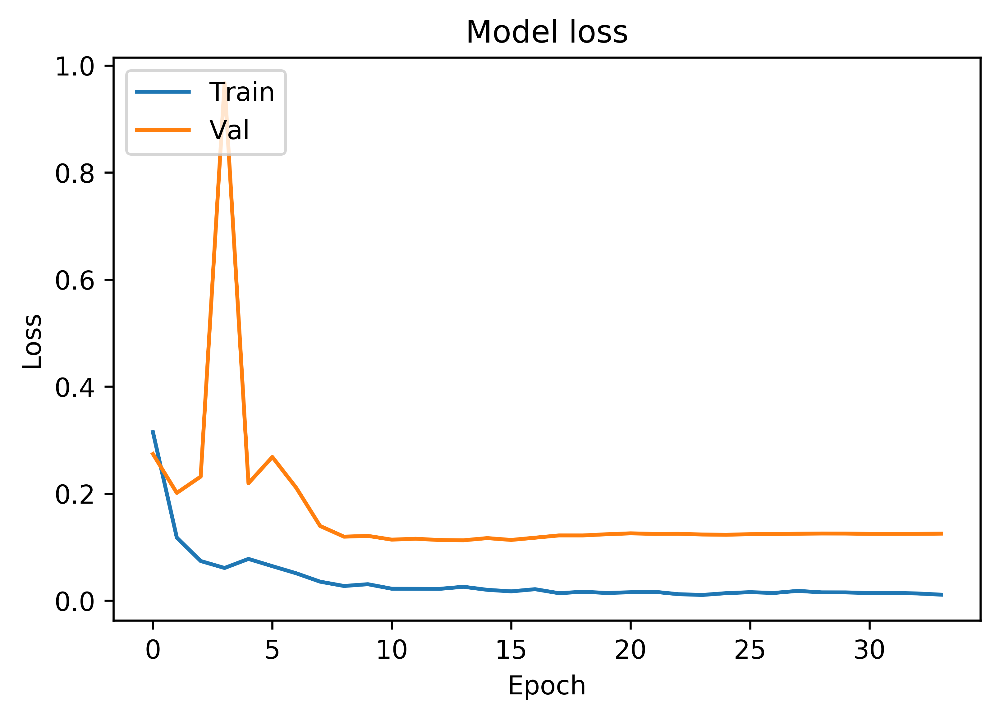

Results from K-fold: 5
acc: 97.42%
1045/1045 [==============================] - 1s 847us/step
[0.12510346099199576, 0.9741626794828753]
          normal  abnormal
normal       657        11
abnormal      16       361
              precision    recall  f1-score   support

      normal       0.98      0.98      0.98       668
    abnormal       0.97      0.96      0.96       377

   micro avg       0.97      0.97      0.97      1045
   macro avg       0.97      0.97      0.97      1045
weighted avg       0.97      0.97      0.97      1045

Average for kfold accuracy and stdev
97.21% (+/- 0.24%)
Average classification report for all folds
              precision  recall  f1_score  support
class                                             
abnormal          0.960   0.964     0.960    377.6
macro_avg         0.968   0.970     0.968   1045.8
micro_avg         0.970   0.970     0.970   1045.8
normal            0.980   0.978     0.978    668.2
weighted_avg      0.970   0.970     0.970   1045.8

In [15]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for key, kfold in kfolds.items():
    print(key)
    train = kfold['train']
    val = kfold['valid']
    
    print('K-: {}'.format(key))
    
    print("Samples from Training")
    print_samples(samples=train, images=X_image, text=X_text, tokenizer=tokenizer)
    print("============================")
    
    print("Samples from Validation")
    print_samples(samples=val, images=X_image, text=X_text, tokenizer=tokenizer)
    print("============================")
    
    #load our weights from our best unimodal models
    img_loc = "unimodal_weights/best_weight_image_only_k-fold_{}.hdf5".format(count)
    txt_loc = "unimodal_weights/best_weight_text_1d_only_k-fold_{}.hdf5".format(count)
    text_image_model = Generate_Model(model_type='multimodal')
    set_weights(text_image_model.layers[-2], 'Image_Branch', img_loc)
    set_weights(text_image_model.layers[-2], 'Text_Branch', txt_loc) 
    text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="model_fusion_weights/best_weight_image_text_pretrained_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]
    
    
    history = text_image_model.fit([X_text[train], X_image[train]], y[train], 
                     epochs=epochs, batch_size=bs, validation_data=([X_text[val], X_image[val]], y[val]), callbacks=callbacks_list)
    plot_model_history(history)
    filepath="model_fusion_weights/final_weight_image_text_pretrained_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[val], X_image[val]], y[val], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[val], X_image[val], y[val]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[val]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    cr = classification_report([np.argmax(t) for t in y[val]], y_hat, target_names=class_names)
    report_list.append(classification_report_df(cr))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))
print("Average classification report for all folds")
print(df_mean(report_list))

In [16]:
### Train test on 70/30 with pretrained weights

In [17]:
reduce_lr_final = ReduceLROnPlateau(monitor='loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
#load our weights from our best unimodal models
img_loc = "unimodal_weights/best_weight_image_only_final.hdf5".format(count)
txt_loc = "unimodal_weights/best_weight_text_1d_only_final.hdf5".format(count)
text_image_model = Generate_Model(model_type='multimodal')
set_weights(text_image_model.layers[-2], 'Image_Branch', img_loc)
set_weights(text_image_model.layers[-2], 'Text_Branch', txt_loc) 
text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
filepath="model_fusion_weights/best_weight_image_text_pretrained_final.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr_final, checkpoint, early_stopping]
history = text_image_model.fit([X_text[final_train], X_image[final_train]], y[final_train], 
                 epochs=epochs, batch_size=bs, validation_data=None, callbacks=callbacks_list)
filepath="model_fusion_weights/final_weight_image_text_pretrained_final.hdf5"
text_image_model.save_weights(filepath)
print('========================TEST MODEL=======================')
scores = text_image_model.evaluate([X_text[final_test], X_image[final_test]], y[final_test], verbose=0)
print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
y_hat = test_model(text_image_model, zip(X_text[final_test], X_image[final_test], y[final_test]), image = True, text = True, 
                   class_names=class_names)

[INFO] training with 2 GPUs...
Epoch 1/150
5229/5229 [==============================] - 21s 4ms/step - loss: 0.1340 - acc: 0.9524

Epoch 00001: acc improved from -inf to 0.95238, saving model to model_fusion_weights/best_weight_image_text_pretrained_final.hdf5
Epoch 2/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.0559 - acc: 0.9839

Epoch 00002: acc improved from 0.95238 to 0.98394, saving model to model_fusion_weights/best_weight_image_text_pretrained_final.hdf5
Epoch 3/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.0322 - acc: 0.9901

Epoch 00003: acc improved from 0.98394 to 0.99006, saving model to model_fusion_weights/best_weight_image_text_pretrained_final.hdf5
Epoch 4/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.0278 - acc: 0.9914

Epoch 00004: acc improved from 0.99006 to 0.99139, saving model to model_fusion_weights/best_weight_image_text_pretrained_final.hdf5
Epoch 5/150
5229/5229 [====================

### Inspect images

blue = ground truth, red = prediction


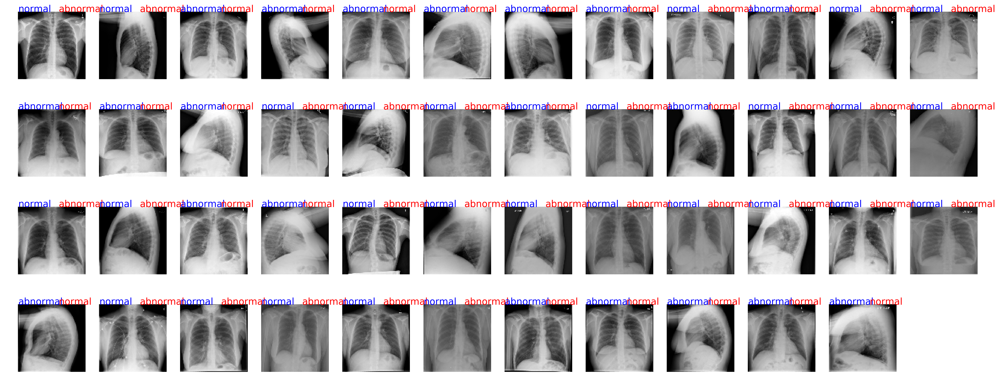

In [18]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[final_test] ]
test_wrong = [im for im in zip(X_image[final_test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

In [19]:
###########################################

### K-Fold validation Multimodal: Train text and images - Randomly Initialized Weights - Square Kernel

fold_1
K-: fold_1
Samples from Training
[1267 5926 2215 2933]


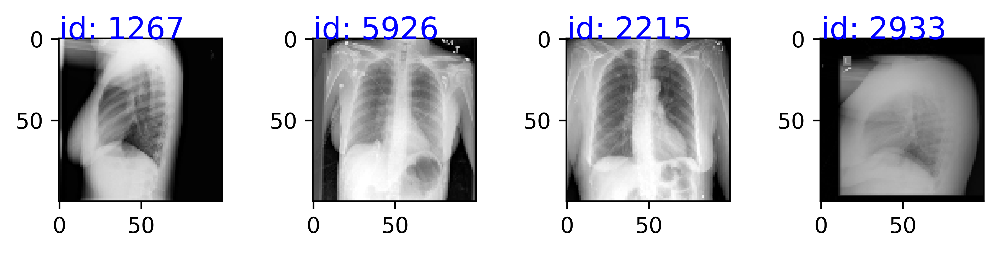

id: 1267
comparison none available indication xxxx-year-old female dyspnea findings heart size normal pneumothorax pleural effusion focal airspace disease bony structures appear intact impression acute cardiopulmonary abnormality 
id: 5926
comparison portable chest xxxx indication xxxx-year-old female chest pain findings heart size within normal limits focal airspace disease pneumothorax pleural effusion impression acute cardiopulmonary findings 
id: 2215
indication colorectal mass evaluate lung mass findings heart normal size mediastinum stable calcified right paratracheal lymph xxxx seen aorta atherosclerotic lungs mildly hypoinflated without focal consolidation pleural effusion impression acute disease 
id: 2933
comparison none indication left sided chest pain findings lungs appear clear heart pulmonary xxxx normal pleural spaces clear mediastinal contours normal impression acute acute cardiopulmonary disease 
Samples from Validation
[  39 6979 3506 3377]


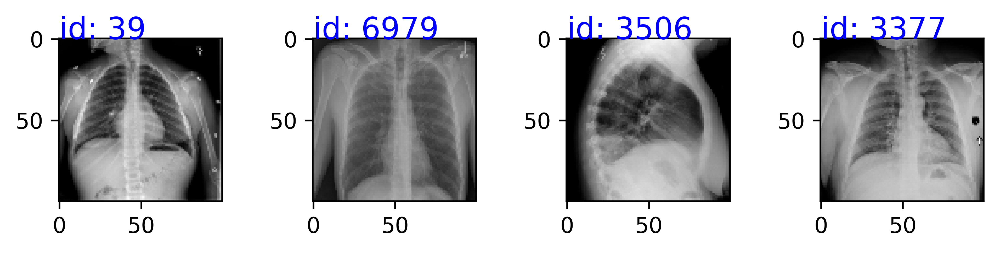

id: 39
comparison none indication left chest pain impression heart size mediastinal silhouette vascularity normal lobar consolidation pleural effusion pneumothorax approximately cm right middle lobe nodular opacity xxxx showing benign type calcification consider followup xxxx chest characterization 
id: 6979
comparison two-view chest radiograph dated xxxx xxxx indication xxxx-year-old xxxx chest pain findings lungs clear bilaterally specifically evidence focal consolidation pneumothorax pleural effusion cardio mediastinal silhouette unremarkable visualized osseous structures thorax without acute abnormality impression stable chest without acute cardiopulmonary abnormality 
id: 3506
comparison xxxx xxxx indication left chest tube removal impression heart size normal significant change left base airspace disease small effusion small residual right pneumothorax increased right base atelectasis catheter overlying right mediastinum may outside patient 
id: 3377
comparison none indication ch

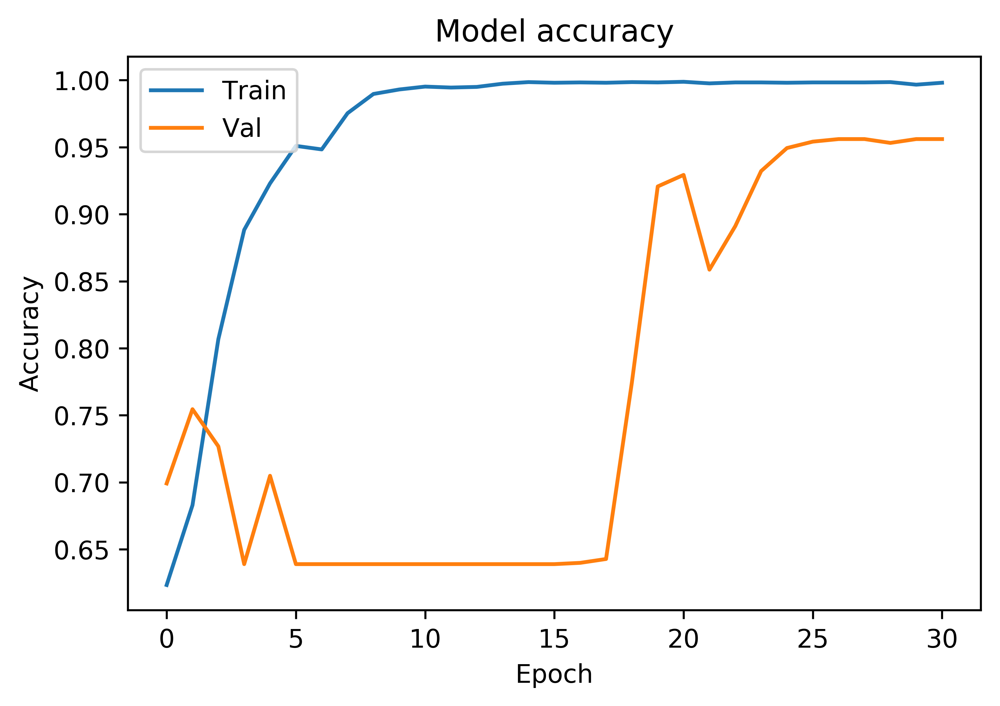

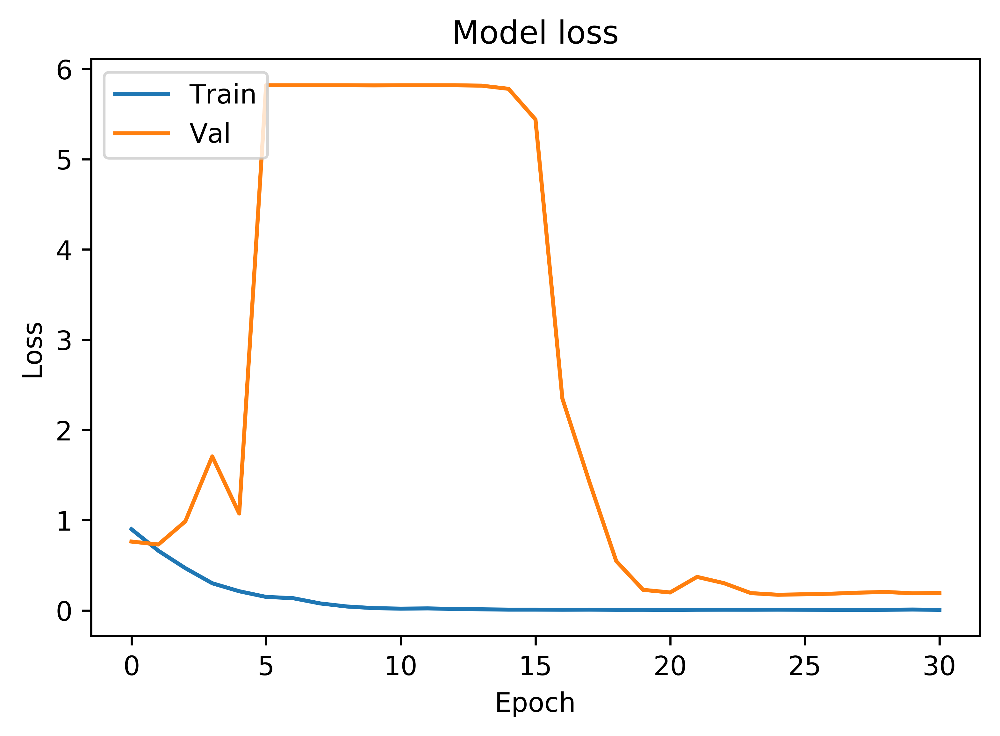

Results from K-fold: 1
acc: 95.61%
1047/1047 [==============================] - 2s 2ms/step
[0.19311267318276987, 0.9560649476966748]
          normal  abnormal
normal       648        21
abnormal      25       353
              precision    recall  f1-score   support

      normal       0.96      0.97      0.97       669
    abnormal       0.94      0.93      0.94       378

   micro avg       0.96      0.96      0.96      1047
   macro avg       0.95      0.95      0.95      1047
weighted avg       0.96      0.96      0.96      1047

fold_2
K-: fold_2
Samples from Training
[6945 4672 2690 2928]


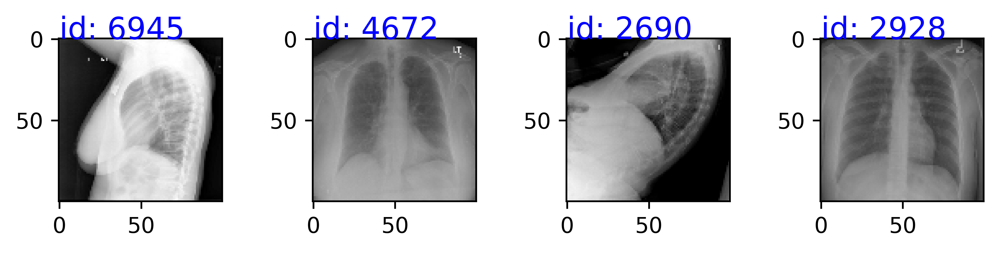

id: 6945
comparison none indication xxxx yr old female dyspnea findings left chest wall mediport placement venous catheter tip superior xxxx xxxx normal cardiac contours pneumothorax pleural effusions clear lungs bilaterally xxxx fracture seen l areas sclerosis throughout thoracic lumbar spine impression pathologic fractures seen l left venous catheter svc 
id: 4672
comparison radiographs chest xxxx xxxx indication shortness breath findings streaky opacity noted within left lung base may represent focal area atelectasis right lung grossly clear cardiac silhouette mediastinal contours within normal limits pneumothorax large pleural effusion impression left lower lobe atelectasis otherwise acute cardiopulmonary disease 
id: 2690
comparison none indication allergic reaction findings cardiomediastinal silhouette normal size configuration atherosclerotic calcification thoracic aorta pulmonary vasculature within normal limits lungs well-aerated pneumothorax pleural effusion focal consolidati

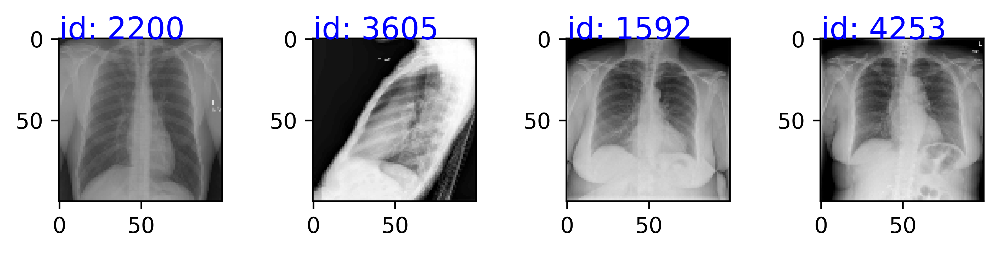

id: 2200
comparison none indication chest pain findings lungs clear bilaterally focal consolidation pleural effusion pneumothoraces cardiomediastinal silhouette within normal limits xxxx unremarkable impression acute cardiopulmonary abnormality 
id: 3605
comparison chest x-xxxx xxxx xxxx indication xxxx-year-old male cachectic hiv patient findings normal heart size mediastinal contours focal airspace consolidation xxxx opacities right lower lung representing atelectasis versus scarring significantly decreased subcutaneous soft tissue since comparison radiograph probable pectus deformity negative acute bony abnormality impression acute cardiopulmonary abnormality hyperlucent lungs xxxx related cachexia probable pectus excavatum deformity 
id: 1592
comparison single ap chest radiograph dated xxxx xxxx indication xxxx-year-old woman wheezing dyspnea findings compared prior examination xxxx stent removed cardiomediastinal silhouette stable within normal limits stable mild atherosclerotic c

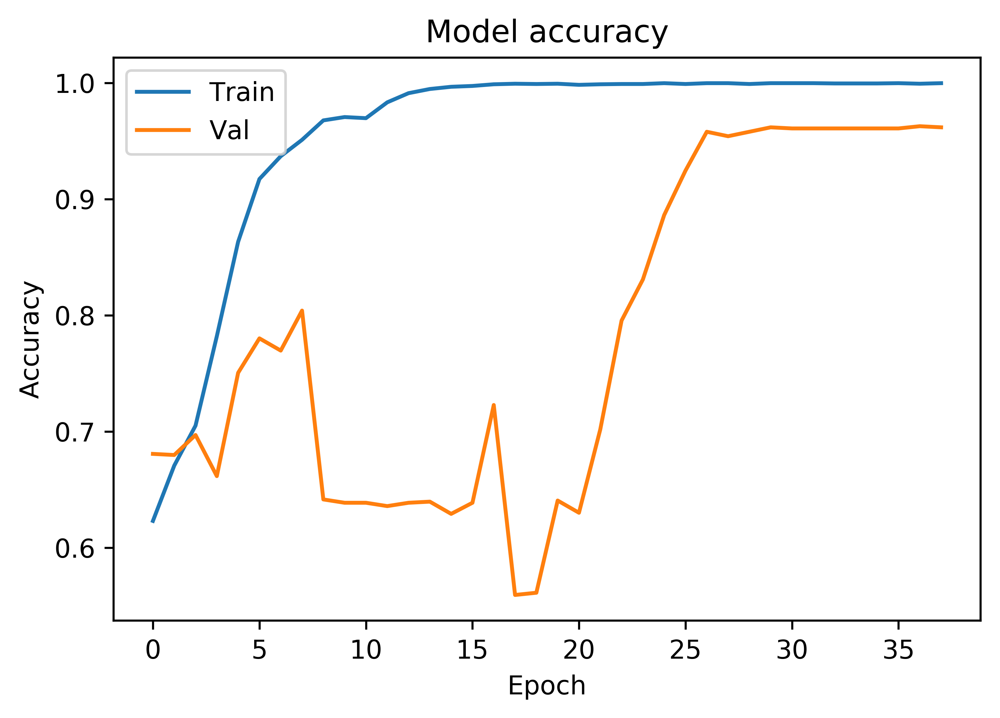

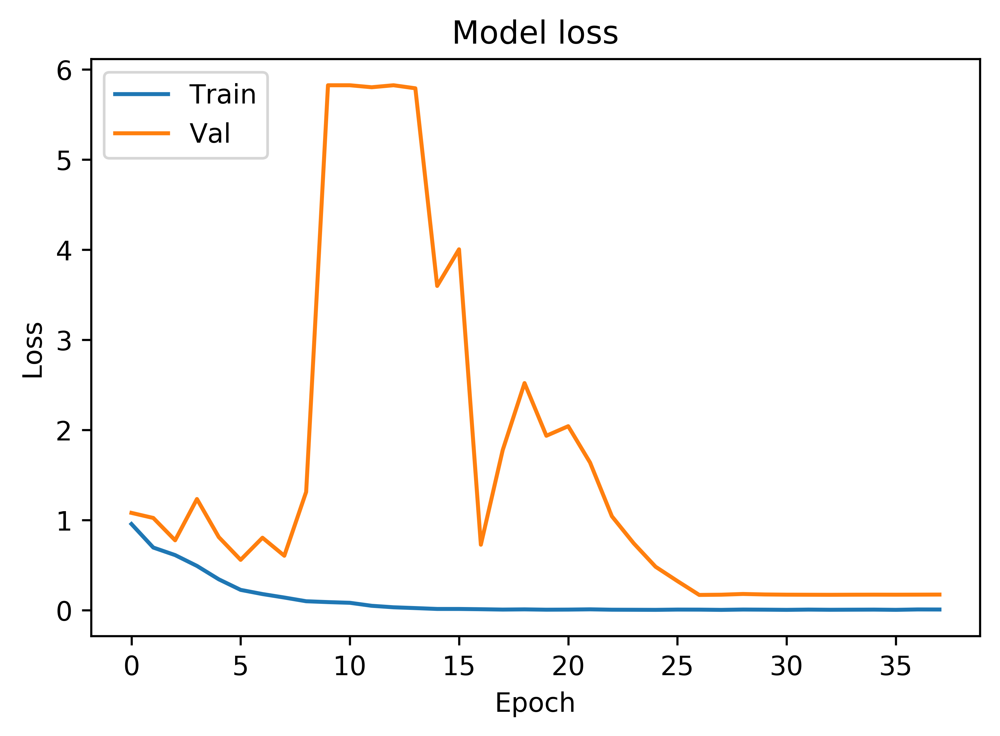

Results from K-fold: 2
acc: 96.18%
1046/1046 [==============================] - 2s 2ms/step
[0.17302895412490085, 0.9617590818760727]
          normal  abnormal
normal       645        23
abnormal      17       361
              precision    recall  f1-score   support

      normal       0.97      0.97      0.97       668
    abnormal       0.94      0.96      0.95       378

   micro avg       0.96      0.96      0.96      1046
   macro avg       0.96      0.96      0.96      1046
weighted avg       0.96      0.96      0.96      1046

fold_3
K-: fold_3
Samples from Training
[1892 2643 6303 1168]


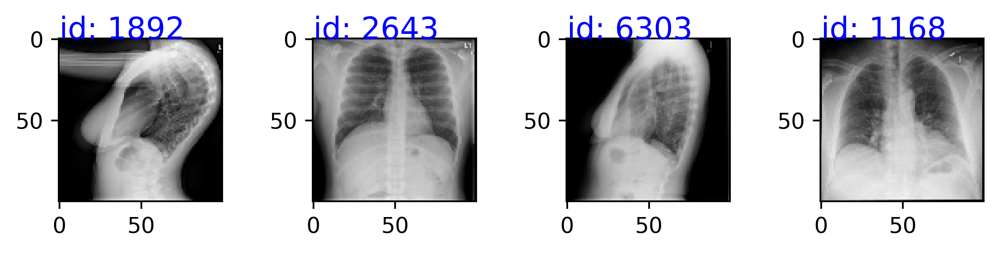

id: 1892
comparison none indication chest pain shortness breath findings lungs pleural spaces show acute abnormality heart size pulmonary vascularity within normal limits impression acute pulmonary abnormality 
id: 2643
indication chest pain impression heart size normal lungs clear 
id: 6303
comparison none indication history smoking status post left upper lobectomy impression heart size normal lungs clear calcified mm granuloma left midlung status post resection left upper lobe adenopathy nodules masses effusion 
id: 1168
comparison none indication sob findings trachea midline heart xxxx slightly large low lung volumes causing bronchovascular crowding otherwise lungs appear clear without evidence acute infiltrate effusion pneumothorax visualized bony structures reveal acute abnormalities impression acute cardiopulmonary abnormalities 
Samples from Validation
[4229 3925 5427 6301]


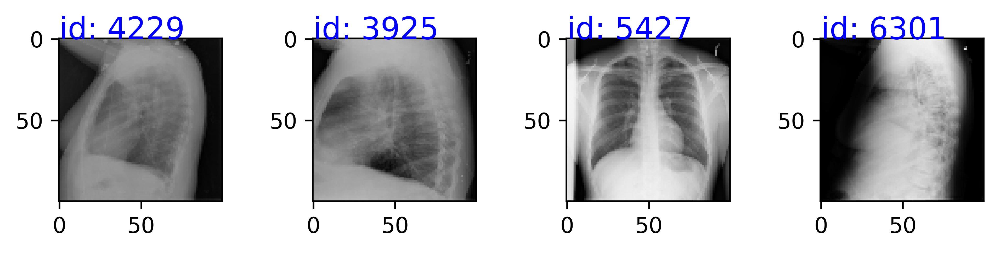

id: 4229
indication history chest pain impression status post left mastectomy heart size normal lungs clear 
id: 3925
comparison chest radiograph xxxx indication xxxx-year-old xxxx chest pain findings acute osseous abnormalities soft tissues within normal limits stable enlargement heart calcific aorta stable bilateral calcified granulomas lungs clear bilaterally without focal area consolidation pleural effusion pneumothorax impression acute radiographic cardiopulmonary process 
id: 5427
comparison none indication chest pain shortness breath xxxx dizziness findings images heart size pulmonary vascular engorgement appear within limits normal mediastinal contour unremarkable focal consolidation pleural effusion pneumothorax identified convincing acute bony findings impression acute cardiopulmonary abnormality identified 
id: 6301
comparison portable chest dated xxxx indication xxxx-year-old male shortness breath findings bilateral patchy pulmonary opacities noted interval improvement left

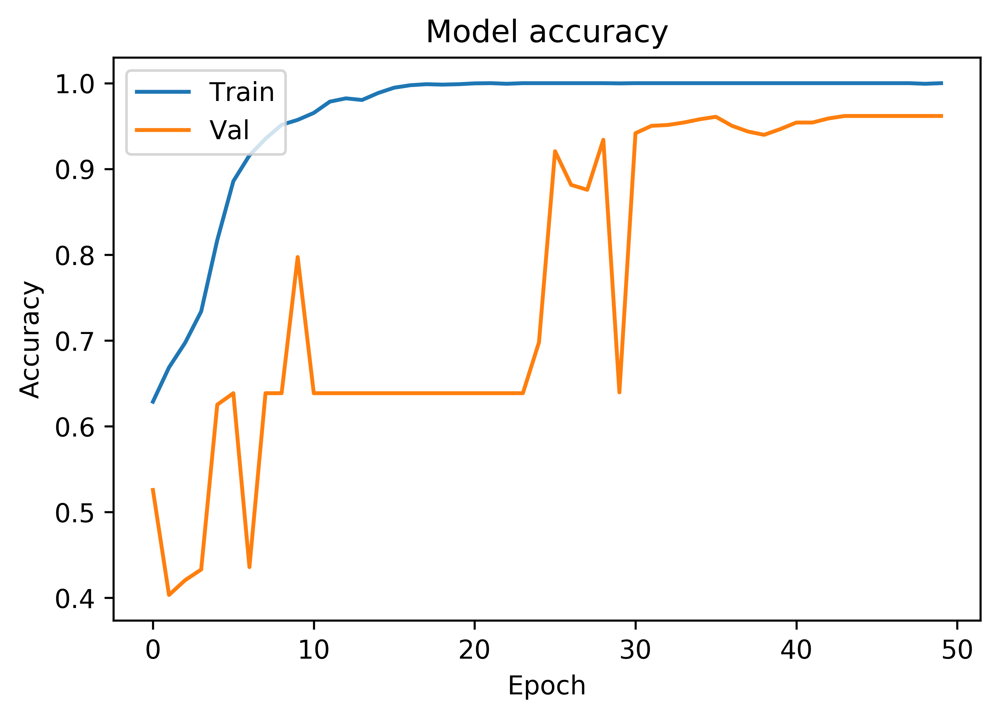

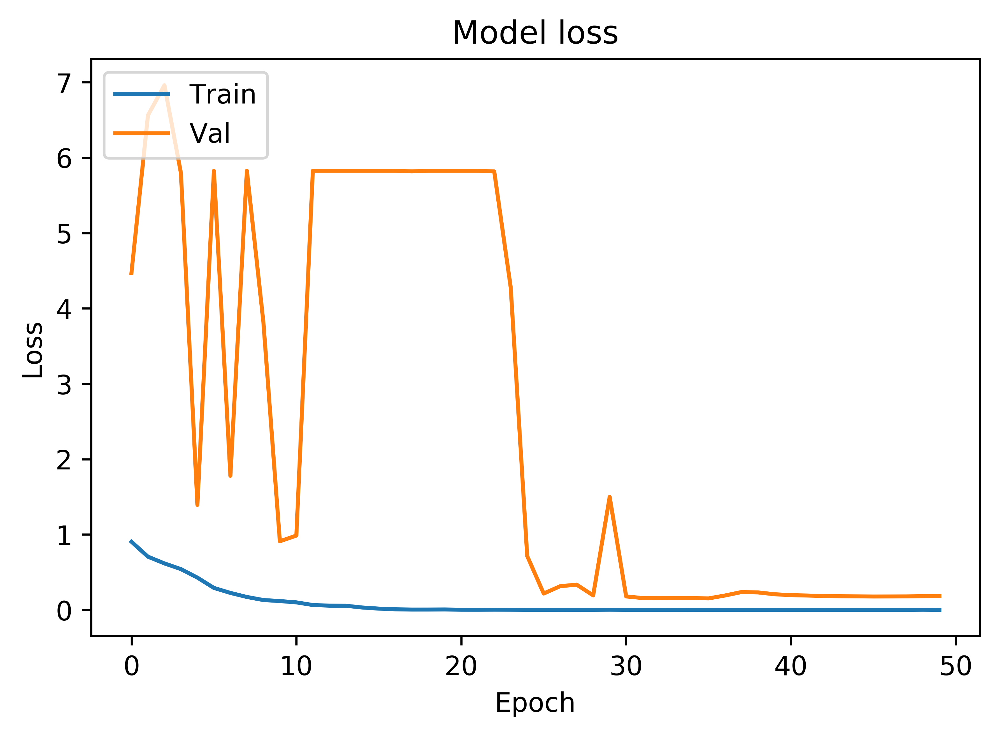

Results from K-fold: 3
acc: 96.18%
1046/1046 [==============================] - 2s 2ms/step
[0.18347795035896633, 0.9617590818760727]
          normal  abnormal
normal       648        20
abnormal      20       358
              precision    recall  f1-score   support

      normal       0.97      0.97      0.97       668
    abnormal       0.95      0.95      0.95       378

   micro avg       0.96      0.96      0.96      1046
   macro avg       0.96      0.96      0.96      1046
weighted avg       0.96      0.96      0.96      1046

fold_4
K-: fold_4
Samples from Training
[3579  177 3127 5831]


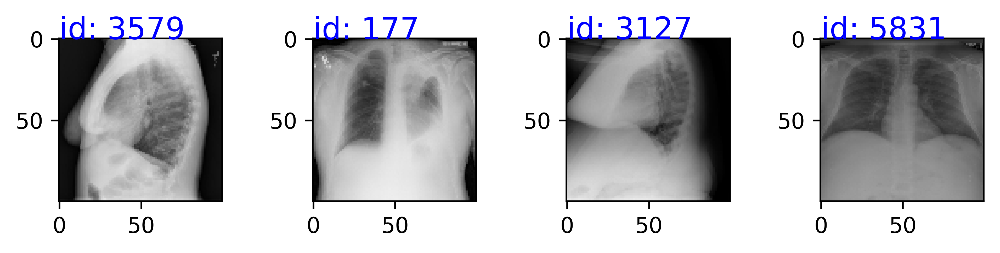

id: 3579
comparison none indication xxxx-year-old female chest pain findings cardiomediastinal silhouettes within normal limits lungs clear without focal consolidation pneumothorax pleural effusion bony thorax unremarkable impression acute cardiopulmonary abnormalities 
id: 177
indication xxxx-year-old male syncopal episode additional information obtained electronic medical record history lung cancer impression mild left costophrenic xxxx blunting xxxx xxxx basilar pleural effusion increased left suprahilar opacity differential diagnosis includes increased volume loss apical pleural fluid tumor progression left hemithorax volume loss leftward shift heart mediastinum xxxx right costophrenic xxxx right lung free focal consolidation 
id: 3127
comparison none indication xxxx-year-old dyspnea preop bariatric studies findings normal heart size clear lungs without pneumothorax pleural effusion impression normal chest exam 
id: 5831
comparison none indication xxxx-year-old male chronic kidney 

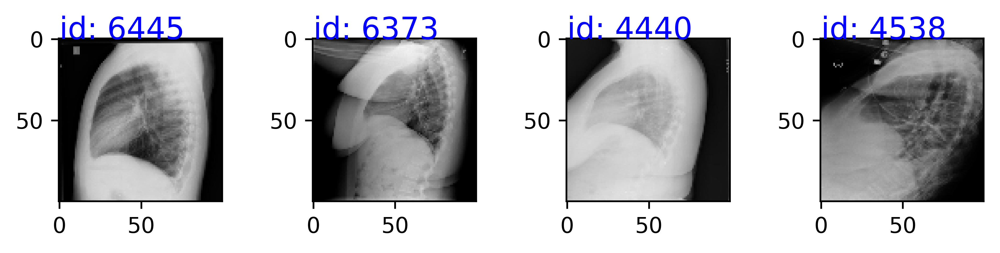

id: 6445
comparison none indication chest pain findings cardiac mediastinal contours within normal limits lungs clear bony structures intact impression negative chest x-xxxx 
id: 6373
comparison none indication back pain findings heart size mediastinal contour normal pulmonary vascularity normal lungs clear pleural effusions pneumothoraces impression acute cardiopulmonary process 
id: 4440
comparison xxxx xxxx indication xxxx-year-old female shortness breath findings cardiomediastinal silhouette normal size contour focal consolidation pneumothorax large pleural effusion normal xxxx impression negative acute abnormality 
id: 4538
indication xxxx-year-old female status post chest tube removal findings stable cardiomediastinal silhouette interval removal right chest tube increased elevation right hemidiaphragm xxxx right basilar atelectasis left basilar consolidation pleural effusions seen xxxx focal consolidation pneumothorax stable left picc tip overlying mid svc large xxxx feeding tube

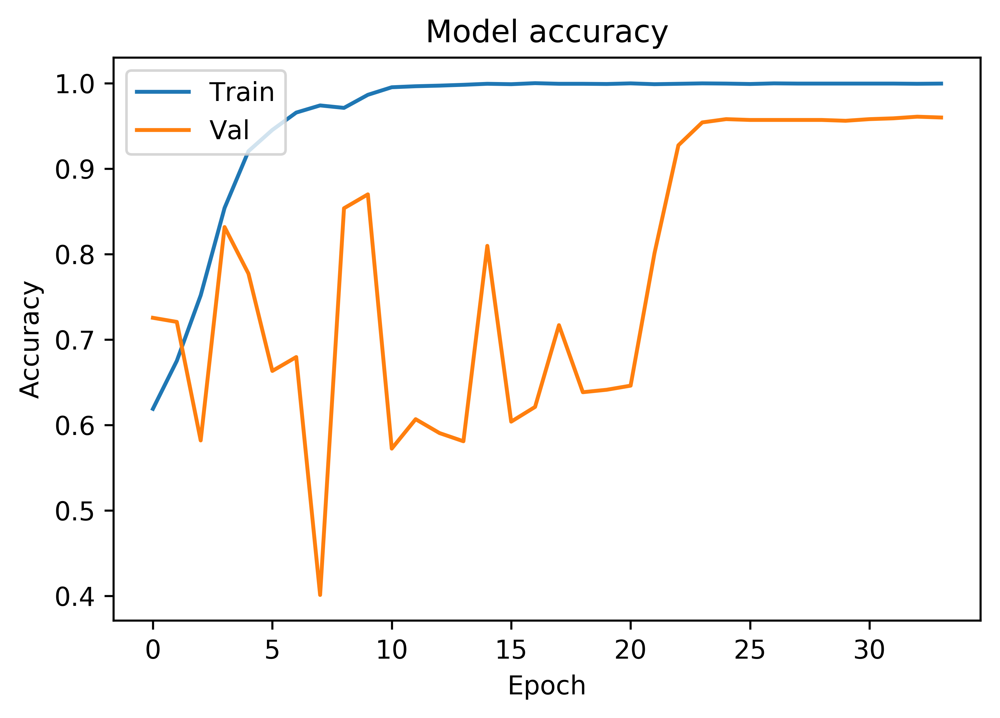

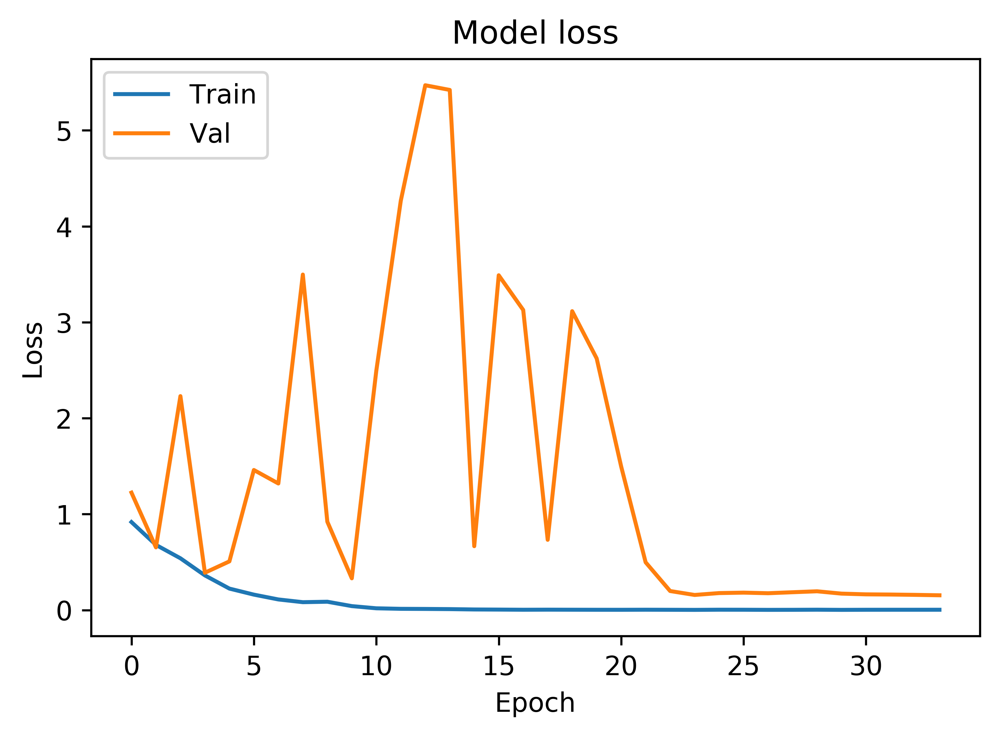

Results from K-fold: 4
acc: 95.98%
1045/1045 [==============================] - 2s 2ms/step
[0.15493338751521976, 0.9598086124972294]
          normal  abnormal
normal       649        19
abnormal      23       354
              precision    recall  f1-score   support

      normal       0.97      0.97      0.97       668
    abnormal       0.95      0.94      0.94       377

   micro avg       0.96      0.96      0.96      1045
   macro avg       0.96      0.96      0.96      1045
weighted avg       0.96      0.96      0.96      1045

fold_5
K-: fold_5
Samples from Training
[5822 5097 4853 3579]


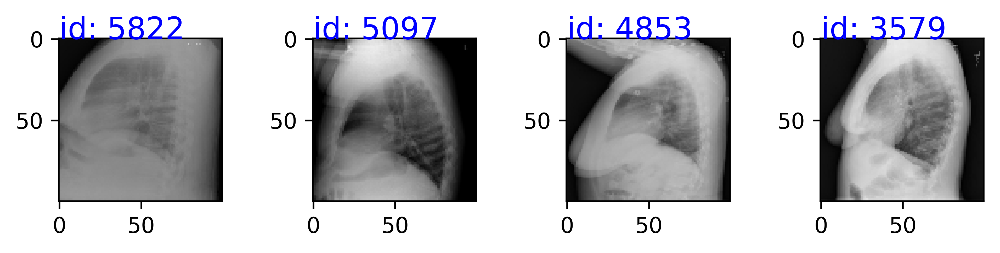

id: 5822
comparison none available indication xxxx-year-old male shortness breath findings heart size mediastinal contours appear within normal limits focal airspace consolidation pleural effusion pneumothorax acute bony abnormalities impression acute cardiopulmonary findings 
id: 5097
comparison none available indication left-sided chest pain findings heart size mildly enlarged tortuous aorta lung volumes low central bronchovascular crowding patchy basilar atelectasis degenerative changes spine impression low volume study without acute process mild cardiomegaly 
id: 4853
comparison xxxx indication chest pain findings heart enlarged aorta tortuous lungs hypoinflated clear pleural effusion pneumothorax seen impression stable cardiomegaly without acute disease 
id: 3579
comparison none indication xxxx-year-old female chest pain findings cardiomediastinal silhouettes within normal limits lungs clear without focal consolidation pneumothorax pleural effusion bony thorax unremarkable impress

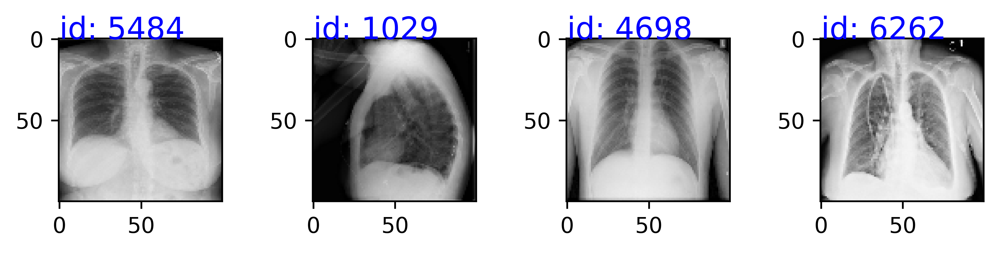

id: 5484
comparison xxxx indication chronic xxxx xxxx findings lungs overall hyperexpanded flattening diaphragms focal consolidation pleural effusions pneumothoraces heart mediastinum normal size contour degenerative changes thoracic spine impression hyperexpanded clear lungs 
id: 1029
comparison xxxx xxxx indication xxxx rule pneumothorax findings cardiomediastinal silhouette pulmonary vasculature within normal limits size thin right apical pneumothorax measuring approximately mm thickness extensive subcutaneous emphysema right chest wall neck fractures right anterior th th anterior ribs mild displacement additional fractures cannot entirely excluded mild streaky airspace disease right lung base left lung clear small hiatal hernia intrathecal catheter terminating lower thoracic spine impression xxxx right apical pneumothorax measuring approximately mm thickness multiple right-sided rib fractures involving xxxx right anterior th th ribs mild displacement mild right basilar airspace dis

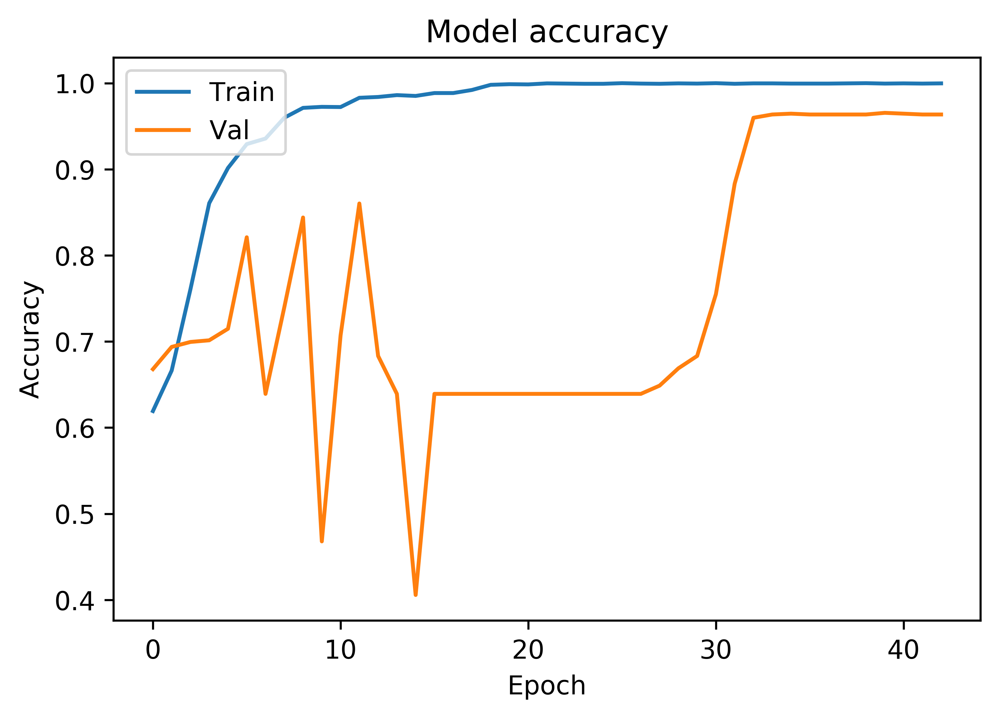

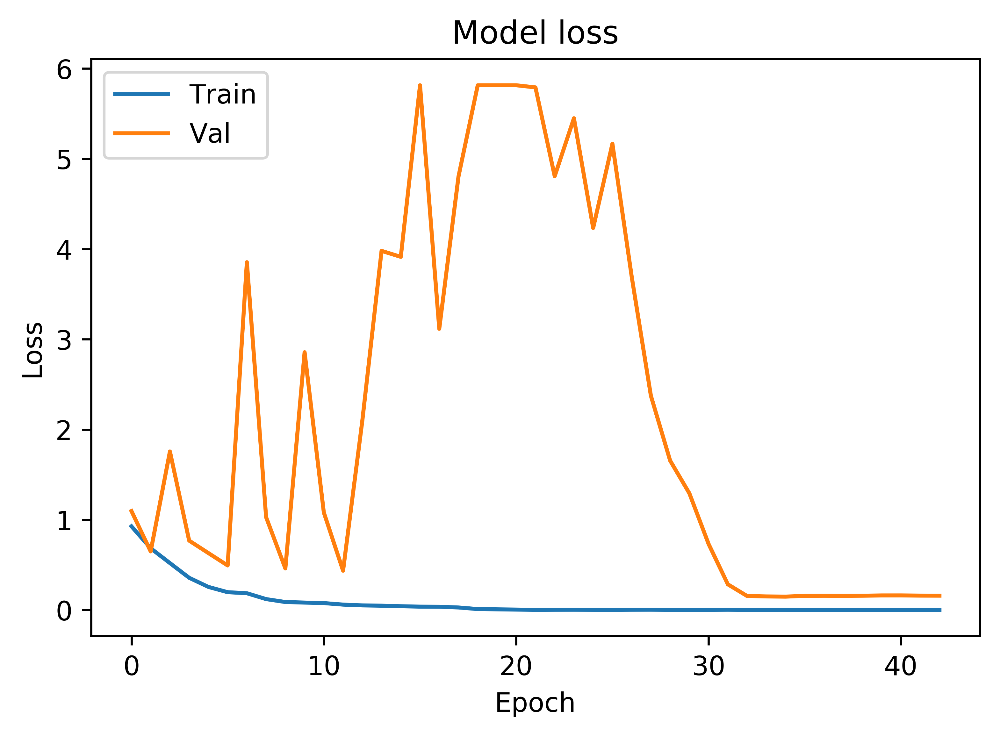

Results from K-fold: 5
acc: 96.36%
1045/1045 [==============================] - 2s 2ms/step
[0.15928571470478398, 0.9636363636363636]
          normal  abnormal
normal       649        19
abnormal      19       358
              precision    recall  f1-score   support

      normal       0.97      0.97      0.97       668
    abnormal       0.95      0.95      0.95       377

   micro avg       0.96      0.96      0.96      1045
   macro avg       0.96      0.96      0.96      1045
weighted avg       0.96      0.96      0.96      1045

Average for kfold accuracy and stdev
96.06% (+/- 0.26%)
Average classification report for all folds
              precision  recall  f1_score  support
class                                             
abnormal          0.946   0.946     0.946    377.6
macro_avg         0.958   0.958     0.958   1045.8
micro_avg         0.960   0.960     0.960   1045.8
normal            0.968   0.970     0.970    668.2
weighted_avg      0.960   0.960     0.960   1045.8


In [20]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for key, kfold in kfolds.items():
    print(key)
    train = kfold['train']
    val = kfold['valid']
    
    print('K-: {}'.format(key))
        
    print("Samples from Training")
    print_samples(samples=train, images=X_image, text=X_text, tokenizer=tokenizer)
    print("============================")
    
    print("Samples from Validation")
    print_samples(samples=val, images=X_image, text=X_text, tokenizer=tokenizer)
    print("============================")
    
    text_image_model = Generate_Model(model_type='multimodal_square_kernel')
    text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="model_fusion_weights/best_weight_image_text_square_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_image_model.fit([X_text[train], X_image[train]], y[train], 
                     epochs=epochs, batch_size=bs, validation_data=([X_text[val], X_image[val]], y[val]), callbacks=callbacks_list)
    plot_model_history(history)
    filepath="model_fusion_weights/final_weight_image_text_square_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[val], X_image[val]], y[val], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[val], X_image[val], y[val]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[val]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    cr = classification_report([np.argmax(t) for t in y[val]], y_hat, target_names=class_names)
    report_list.append(classification_report_df(cr))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))
print("Average classification report for all folds")
print(df_mean(report_list))

In [21]:
reduce_lr_final = ReduceLROnPlateau(monitor='loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
text_image_model = Generate_Model(model_type = 'multimodal')
text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
filepath="model_fusion_weights/best_weight_image_text_square_final.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr_final, checkpoint, early_stopping]

history = text_image_model.fit([X_text[final_train], X_image[final_train]], y[final_train], 
                 epochs=epochs, batch_size=bs, validation_data=None, callbacks=callbacks_list)
filepath="model_fusion_weights/best_weight_image_text_square_final.hdf5"
text_image_model.save_weights(filepath)
print('========================TEST MODEL=======================')
scores = text_image_model.evaluate([X_text[final_test], X_image[final_test]], y[final_test], verbose=0)
print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
y_hat = test_model(text_image_model, zip(X_text[final_test], X_image[final_test], y[final_test]), image = True, text = True, 
                   class_names=class_names)

[INFO] training with 2 GPUs...
Epoch 1/150
5229/5229 [==============================] - 29s 6ms/step - loss: 0.7306 - acc: 0.7388

Epoch 00001: acc improved from -inf to 0.73876, saving model to model_fusion_weights/best_weight_image_text_square_final.hdf5
Epoch 2/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.3676 - acc: 0.8636

Epoch 00002: acc improved from 0.73876 to 0.86365, saving model to model_fusion_weights/best_weight_image_text_square_final.hdf5
Epoch 3/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.2446 - acc: 0.9090

Epoch 00003: acc improved from 0.86365 to 0.90897, saving model to model_fusion_weights/best_weight_image_text_square_final.hdf5
Epoch 4/150
5229/5229 [==============================] - 6s 1ms/step - loss: 0.1810 - acc: 0.9333

Epoch 00004: acc improved from 0.90897 to 0.93326, saving model to model_fusion_weights/best_weight_image_text_square_final.hdf5
Epoch 5/150
5229/5229 [==============================] - 6s

### Inspect images

blue = ground truth, red = prediction


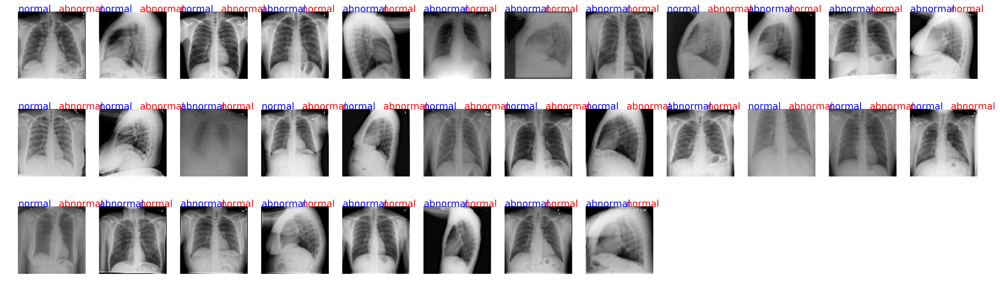

In [22]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[final_test] ]
test_wrong = [im for im in zip(X_image[final_test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

### K-Fold validation Multimodal: Train text and images - Pre-Trained Weights - Square Kernel

fold_1
K-: fold_1
Samples from Training
[1267 5926 2215 2933]


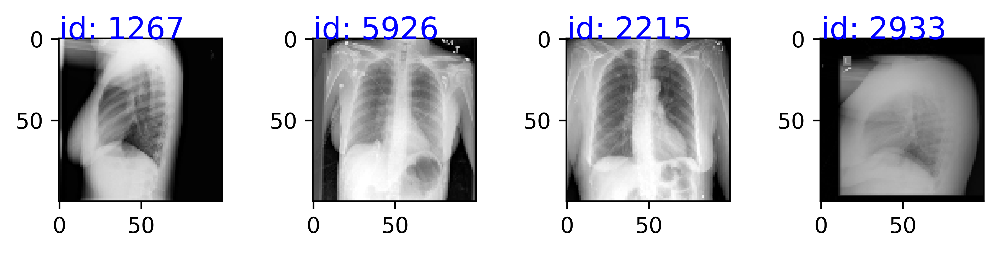

id: 1267
comparison none available indication xxxx-year-old female dyspnea findings heart size normal pneumothorax pleural effusion focal airspace disease bony structures appear intact impression acute cardiopulmonary abnormality 
id: 5926
comparison portable chest xxxx indication xxxx-year-old female chest pain findings heart size within normal limits focal airspace disease pneumothorax pleural effusion impression acute cardiopulmonary findings 
id: 2215
indication colorectal mass evaluate lung mass findings heart normal size mediastinum stable calcified right paratracheal lymph xxxx seen aorta atherosclerotic lungs mildly hypoinflated without focal consolidation pleural effusion impression acute disease 
id: 2933
comparison none indication left sided chest pain findings lungs appear clear heart pulmonary xxxx normal pleural spaces clear mediastinal contours normal impression acute acute cardiopulmonary disease 
Samples from Validation
[  39 6979 3506 3377]


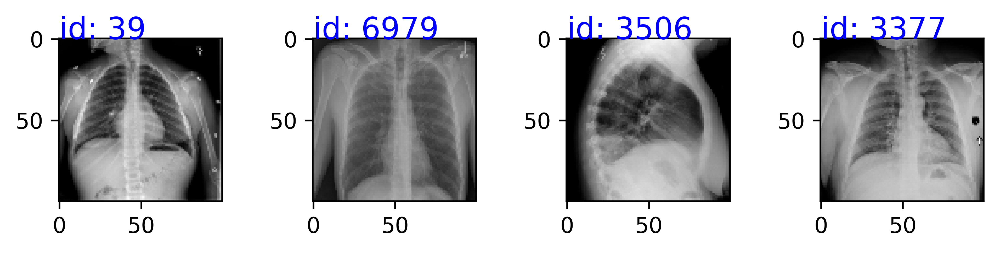

id: 39
comparison none indication left chest pain impression heart size mediastinal silhouette vascularity normal lobar consolidation pleural effusion pneumothorax approximately cm right middle lobe nodular opacity xxxx showing benign type calcification consider followup xxxx chest characterization 
id: 6979
comparison two-view chest radiograph dated xxxx xxxx indication xxxx-year-old xxxx chest pain findings lungs clear bilaterally specifically evidence focal consolidation pneumothorax pleural effusion cardio mediastinal silhouette unremarkable visualized osseous structures thorax without acute abnormality impression stable chest without acute cardiopulmonary abnormality 
id: 3506
comparison xxxx xxxx indication left chest tube removal impression heart size normal significant change left base airspace disease small effusion small residual right pneumothorax increased right base atelectasis catheter overlying right mediastinum may outside patient 
id: 3377
comparison none indication ch

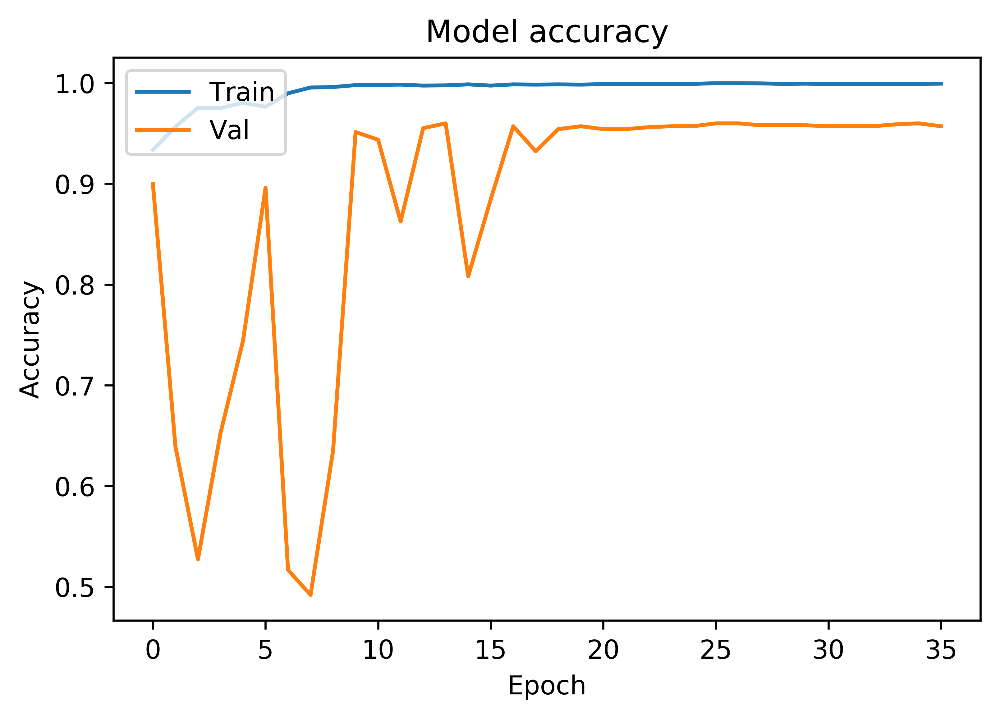

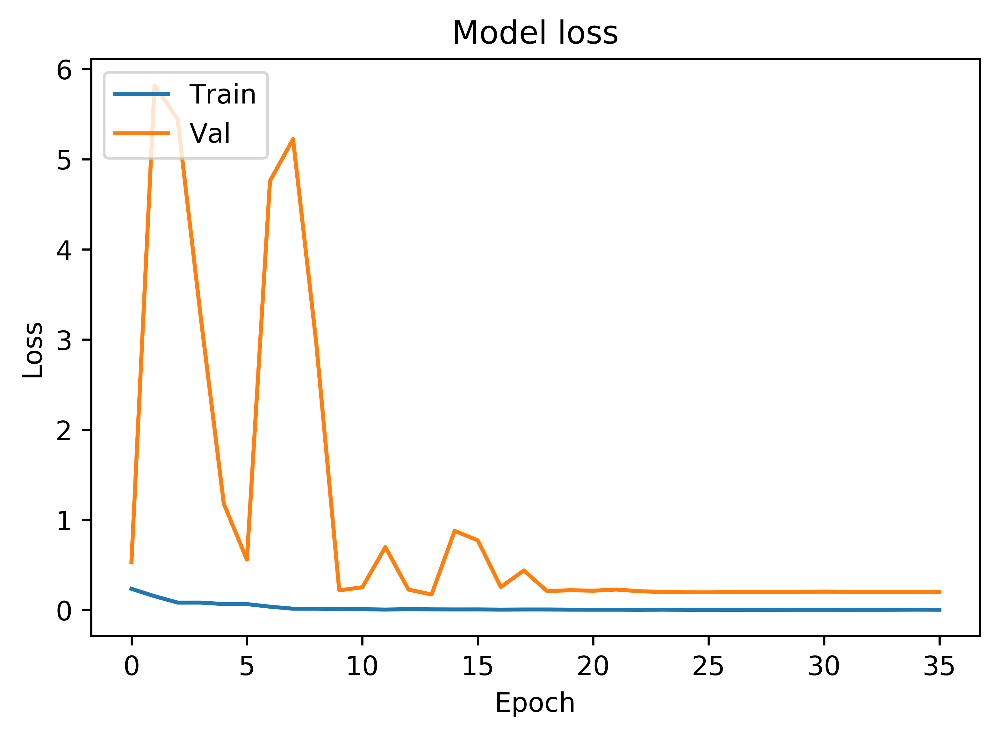

Results from K-fold: 1
acc: 95.70%
1047/1047 [==============================] - 2s 2ms/step
[0.20261309943548844, 0.9570200575343062]
          normal  abnormal
normal       653        16
abnormal      29       349
              precision    recall  f1-score   support

      normal       0.96      0.98      0.97       669
    abnormal       0.96      0.92      0.94       378

   micro avg       0.96      0.96      0.96      1047
   macro avg       0.96      0.95      0.95      1047
weighted avg       0.96      0.96      0.96      1047

fold_2
K-: fold_2
Samples from Training
[6945 4672 2690 2928]


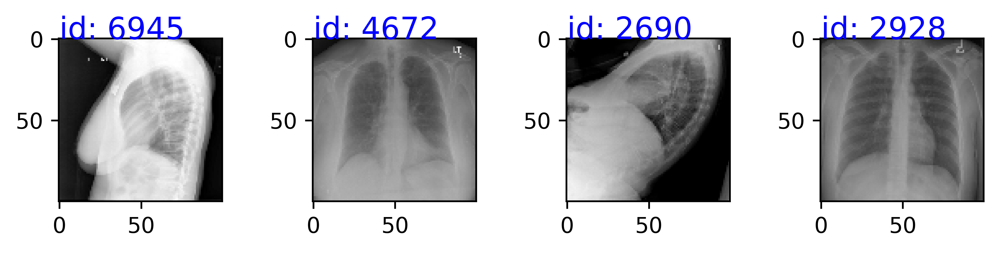

id: 6945
comparison none indication xxxx yr old female dyspnea findings left chest wall mediport placement venous catheter tip superior xxxx xxxx normal cardiac contours pneumothorax pleural effusions clear lungs bilaterally xxxx fracture seen l areas sclerosis throughout thoracic lumbar spine impression pathologic fractures seen l left venous catheter svc 
id: 4672
comparison radiographs chest xxxx xxxx indication shortness breath findings streaky opacity noted within left lung base may represent focal area atelectasis right lung grossly clear cardiac silhouette mediastinal contours within normal limits pneumothorax large pleural effusion impression left lower lobe atelectasis otherwise acute cardiopulmonary disease 
id: 2690
comparison none indication allergic reaction findings cardiomediastinal silhouette normal size configuration atherosclerotic calcification thoracic aorta pulmonary vasculature within normal limits lungs well-aerated pneumothorax pleural effusion focal consolidati

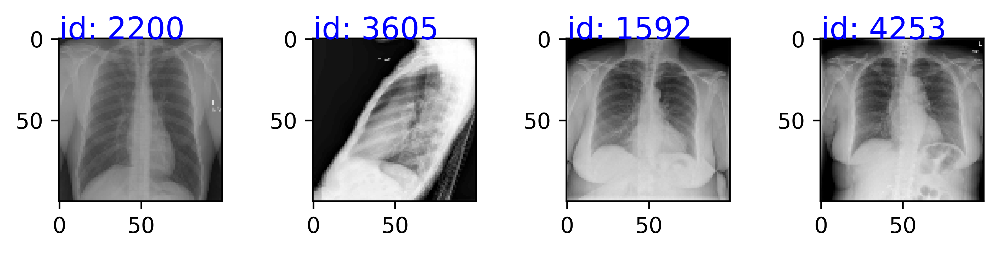

id: 2200
comparison none indication chest pain findings lungs clear bilaterally focal consolidation pleural effusion pneumothoraces cardiomediastinal silhouette within normal limits xxxx unremarkable impression acute cardiopulmonary abnormality 
id: 3605
comparison chest x-xxxx xxxx xxxx indication xxxx-year-old male cachectic hiv patient findings normal heart size mediastinal contours focal airspace consolidation xxxx opacities right lower lung representing atelectasis versus scarring significantly decreased subcutaneous soft tissue since comparison radiograph probable pectus deformity negative acute bony abnormality impression acute cardiopulmonary abnormality hyperlucent lungs xxxx related cachexia probable pectus excavatum deformity 
id: 1592
comparison single ap chest radiograph dated xxxx xxxx indication xxxx-year-old woman wheezing dyspnea findings compared prior examination xxxx stent removed cardiomediastinal silhouette stable within normal limits stable mild atherosclerotic c

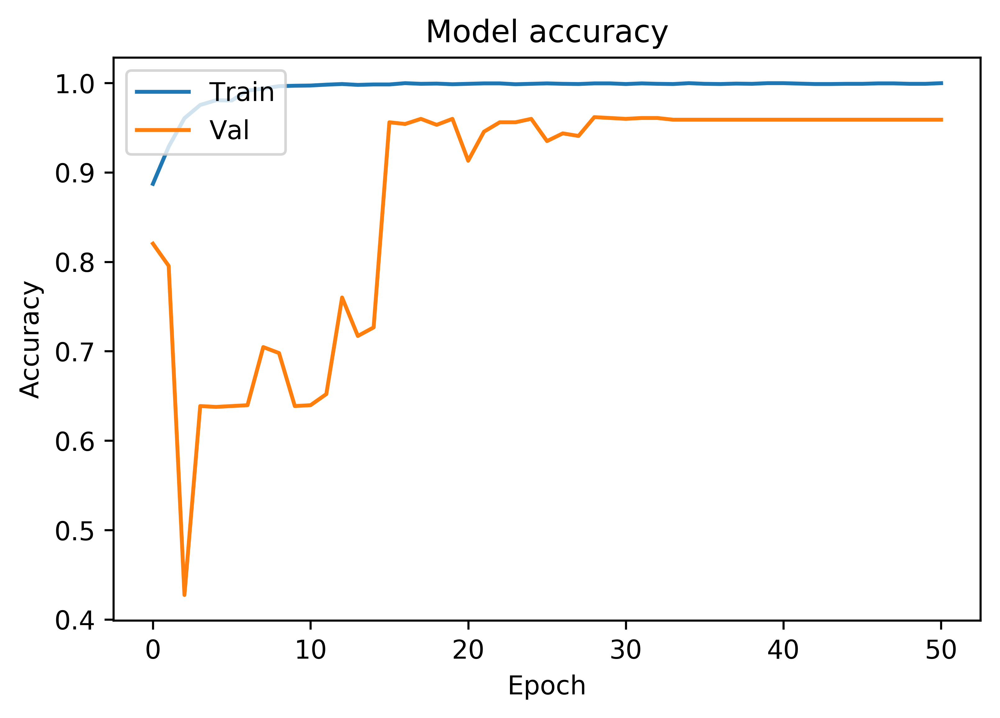

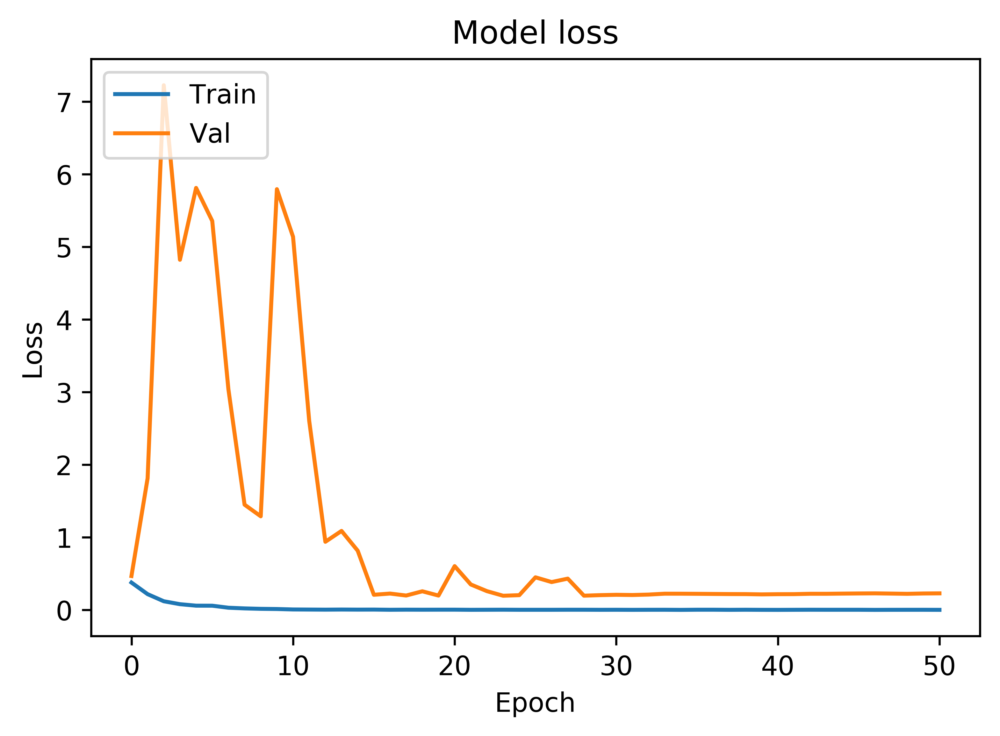

Results from K-fold: 2
acc: 95.89%
1046/1046 [==============================] - 2s 2ms/step
[0.22911099491135198, 0.9588910139541553]
          normal  abnormal
normal       644        24
abnormal      19       359
              precision    recall  f1-score   support

      normal       0.97      0.96      0.97       668
    abnormal       0.94      0.95      0.94       378

   micro avg       0.96      0.96      0.96      1046
   macro avg       0.95      0.96      0.96      1046
weighted avg       0.96      0.96      0.96      1046

fold_3
K-: fold_3
Samples from Training
[1892 2643 6303 1168]


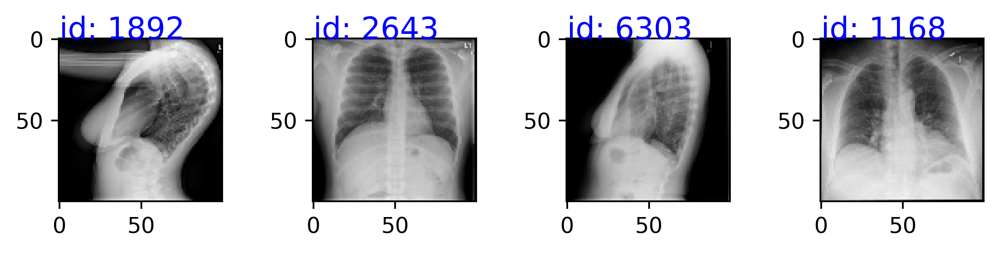

id: 1892
comparison none indication chest pain shortness breath findings lungs pleural spaces show acute abnormality heart size pulmonary vascularity within normal limits impression acute pulmonary abnormality 
id: 2643
indication chest pain impression heart size normal lungs clear 
id: 6303
comparison none indication history smoking status post left upper lobectomy impression heart size normal lungs clear calcified mm granuloma left midlung status post resection left upper lobe adenopathy nodules masses effusion 
id: 1168
comparison none indication sob findings trachea midline heart xxxx slightly large low lung volumes causing bronchovascular crowding otherwise lungs appear clear without evidence acute infiltrate effusion pneumothorax visualized bony structures reveal acute abnormalities impression acute cardiopulmonary abnormalities 
Samples from Validation
[4229 3925 5427 6301]


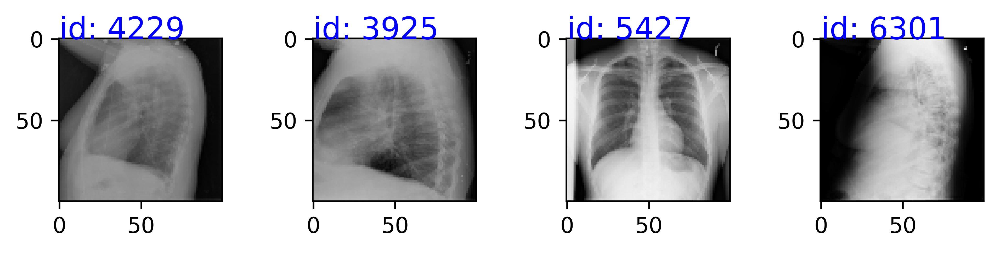

id: 4229
indication history chest pain impression status post left mastectomy heart size normal lungs clear 
id: 3925
comparison chest radiograph xxxx indication xxxx-year-old xxxx chest pain findings acute osseous abnormalities soft tissues within normal limits stable enlargement heart calcific aorta stable bilateral calcified granulomas lungs clear bilaterally without focal area consolidation pleural effusion pneumothorax impression acute radiographic cardiopulmonary process 
id: 5427
comparison none indication chest pain shortness breath xxxx dizziness findings images heart size pulmonary vascular engorgement appear within limits normal mediastinal contour unremarkable focal consolidation pleural effusion pneumothorax identified convincing acute bony findings impression acute cardiopulmonary abnormality identified 
id: 6301
comparison portable chest dated xxxx indication xxxx-year-old male shortness breath findings bilateral patchy pulmonary opacities noted interval improvement left

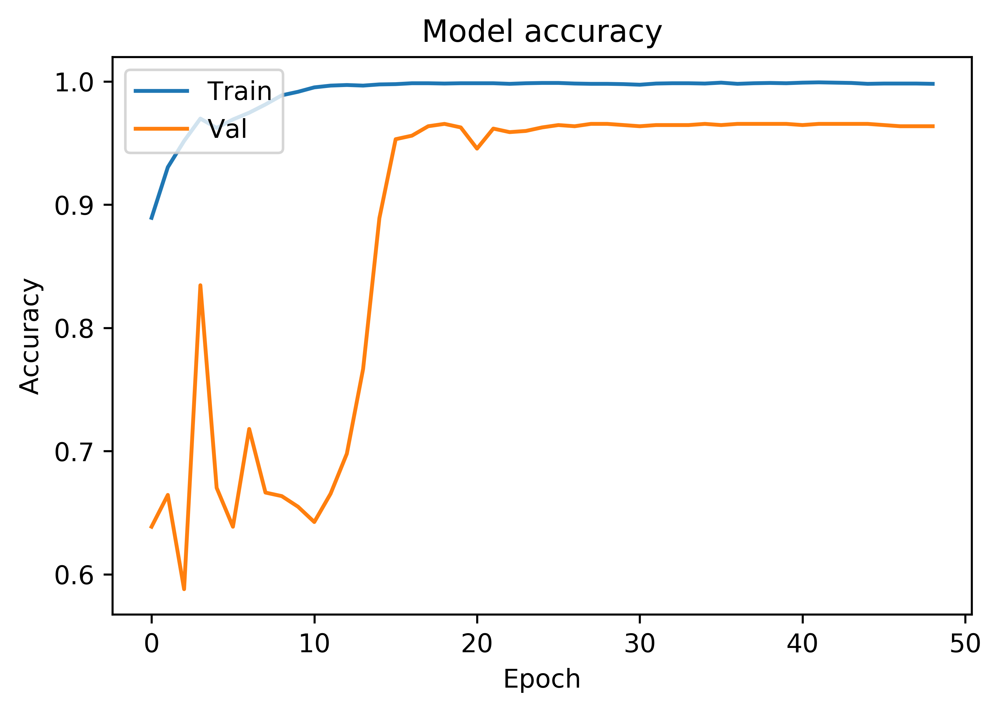

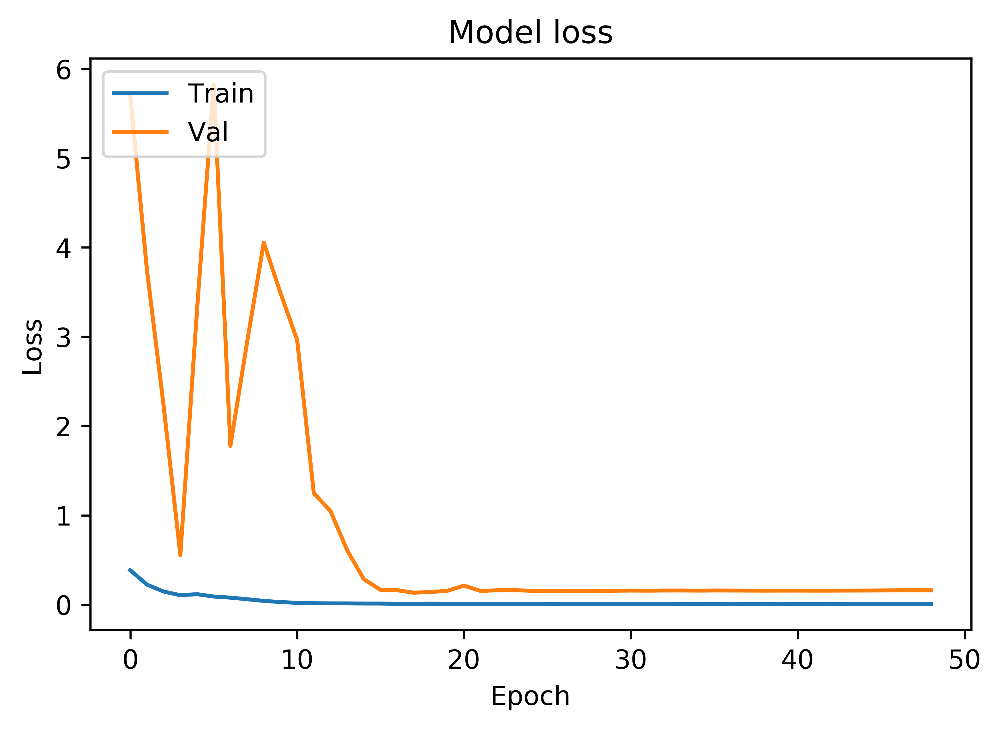

Results from K-fold: 3
acc: 96.37%
1046/1046 [==============================] - 2s 2ms/step
[0.16001109976898417, 0.9636711277651742]
          normal  abnormal
normal       648        20
abnormal      18       360
              precision    recall  f1-score   support

      normal       0.97      0.97      0.97       668
    abnormal       0.95      0.95      0.95       378

   micro avg       0.96      0.96      0.96      1046
   macro avg       0.96      0.96      0.96      1046
weighted avg       0.96      0.96      0.96      1046

fold_4
K-: fold_4
Samples from Training
[3579  177 3127 5831]


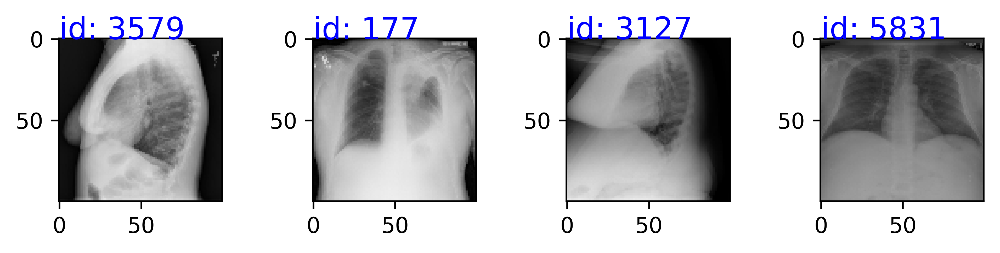

id: 3579
comparison none indication xxxx-year-old female chest pain findings cardiomediastinal silhouettes within normal limits lungs clear without focal consolidation pneumothorax pleural effusion bony thorax unremarkable impression acute cardiopulmonary abnormalities 
id: 177
indication xxxx-year-old male syncopal episode additional information obtained electronic medical record history lung cancer impression mild left costophrenic xxxx blunting xxxx xxxx basilar pleural effusion increased left suprahilar opacity differential diagnosis includes increased volume loss apical pleural fluid tumor progression left hemithorax volume loss leftward shift heart mediastinum xxxx right costophrenic xxxx right lung free focal consolidation 
id: 3127
comparison none indication xxxx-year-old dyspnea preop bariatric studies findings normal heart size clear lungs without pneumothorax pleural effusion impression normal chest exam 
id: 5831
comparison none indication xxxx-year-old male chronic kidney 

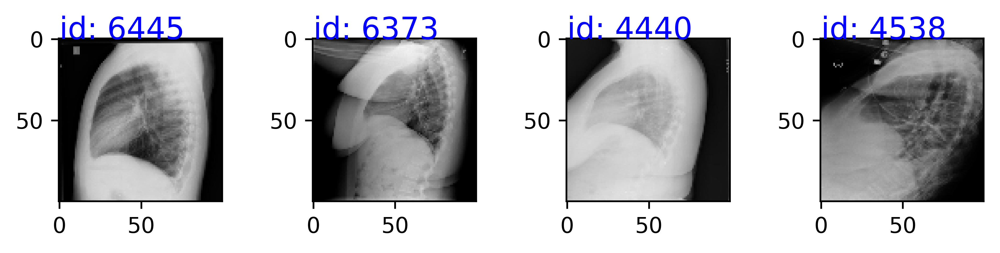

id: 6445
comparison none indication chest pain findings cardiac mediastinal contours within normal limits lungs clear bony structures intact impression negative chest x-xxxx 
id: 6373
comparison none indication back pain findings heart size mediastinal contour normal pulmonary vascularity normal lungs clear pleural effusions pneumothoraces impression acute cardiopulmonary process 
id: 4440
comparison xxxx xxxx indication xxxx-year-old female shortness breath findings cardiomediastinal silhouette normal size contour focal consolidation pneumothorax large pleural effusion normal xxxx impression negative acute abnormality 
id: 4538
indication xxxx-year-old female status post chest tube removal findings stable cardiomediastinal silhouette interval removal right chest tube increased elevation right hemidiaphragm xxxx right basilar atelectasis left basilar consolidation pleural effusions seen xxxx focal consolidation pneumothorax stable left picc tip overlying mid svc large xxxx feeding tube

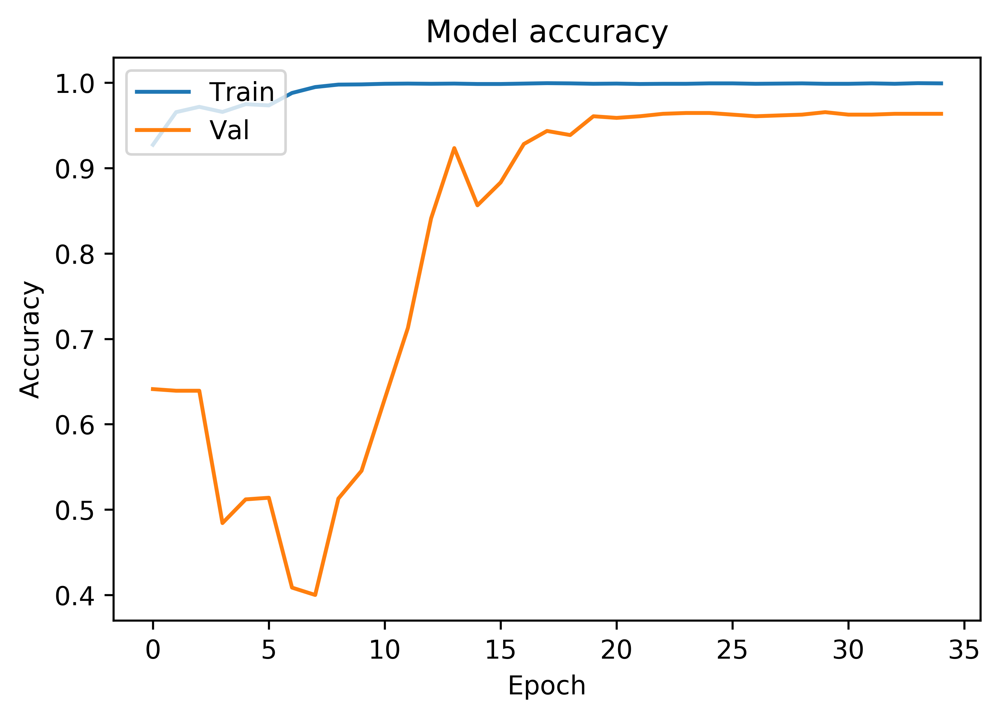

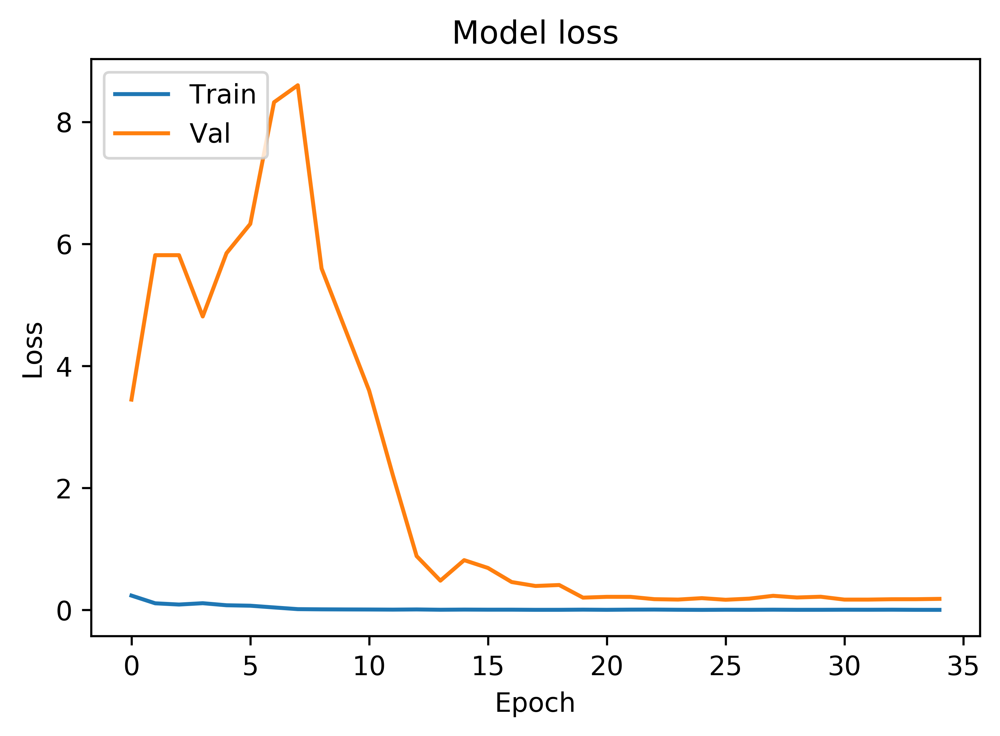

Results from K-fold: 4
acc: 96.36%
1045/1045 [==============================] - 2s 2ms/step
[0.18232432700868786, 0.9636363636363636]
          normal  abnormal
normal       651        17
abnormal      21       356
              precision    recall  f1-score   support

      normal       0.97      0.97      0.97       668
    abnormal       0.95      0.94      0.95       377

   micro avg       0.96      0.96      0.96      1045
   macro avg       0.96      0.96      0.96      1045
weighted avg       0.96      0.96      0.96      1045

fold_5
K-: fold_5
Samples from Training
[5822 5097 4853 3579]


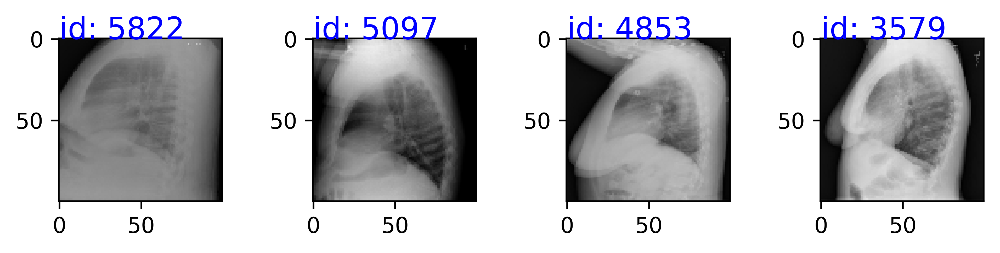

id: 5822
comparison none available indication xxxx-year-old male shortness breath findings heart size mediastinal contours appear within normal limits focal airspace consolidation pleural effusion pneumothorax acute bony abnormalities impression acute cardiopulmonary findings 
id: 5097
comparison none available indication left-sided chest pain findings heart size mildly enlarged tortuous aorta lung volumes low central bronchovascular crowding patchy basilar atelectasis degenerative changes spine impression low volume study without acute process mild cardiomegaly 
id: 4853
comparison xxxx indication chest pain findings heart enlarged aorta tortuous lungs hypoinflated clear pleural effusion pneumothorax seen impression stable cardiomegaly without acute disease 
id: 3579
comparison none indication xxxx-year-old female chest pain findings cardiomediastinal silhouettes within normal limits lungs clear without focal consolidation pneumothorax pleural effusion bony thorax unremarkable impress

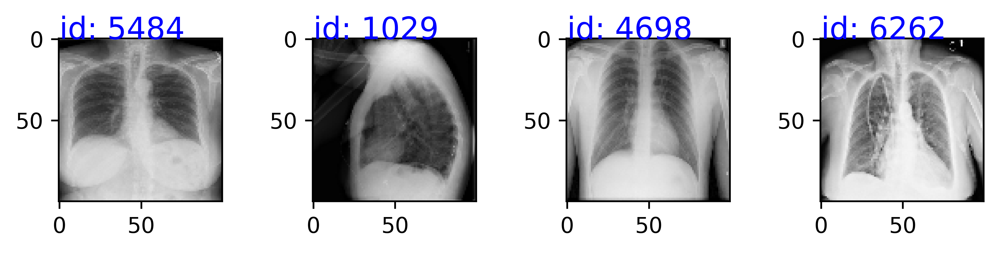

id: 5484
comparison xxxx indication chronic xxxx xxxx findings lungs overall hyperexpanded flattening diaphragms focal consolidation pleural effusions pneumothoraces heart mediastinum normal size contour degenerative changes thoracic spine impression hyperexpanded clear lungs 
id: 1029
comparison xxxx xxxx indication xxxx rule pneumothorax findings cardiomediastinal silhouette pulmonary vasculature within normal limits size thin right apical pneumothorax measuring approximately mm thickness extensive subcutaneous emphysema right chest wall neck fractures right anterior th th anterior ribs mild displacement additional fractures cannot entirely excluded mild streaky airspace disease right lung base left lung clear small hiatal hernia intrathecal catheter terminating lower thoracic spine impression xxxx right apical pneumothorax measuring approximately mm thickness multiple right-sided rib fractures involving xxxx right anterior th th ribs mild displacement mild right basilar airspace dis

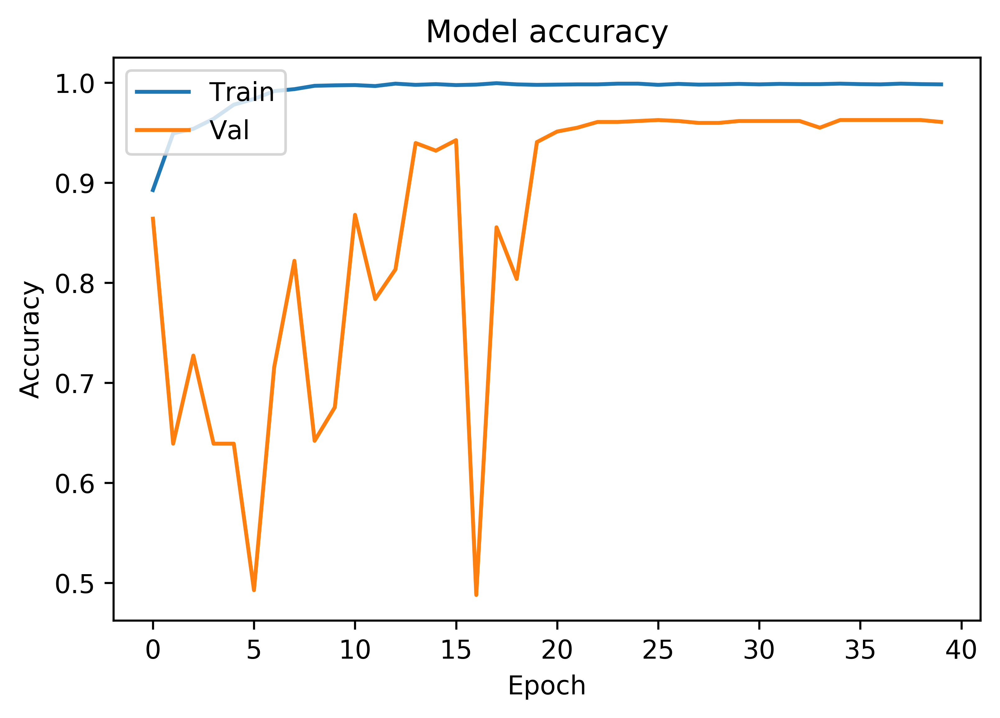

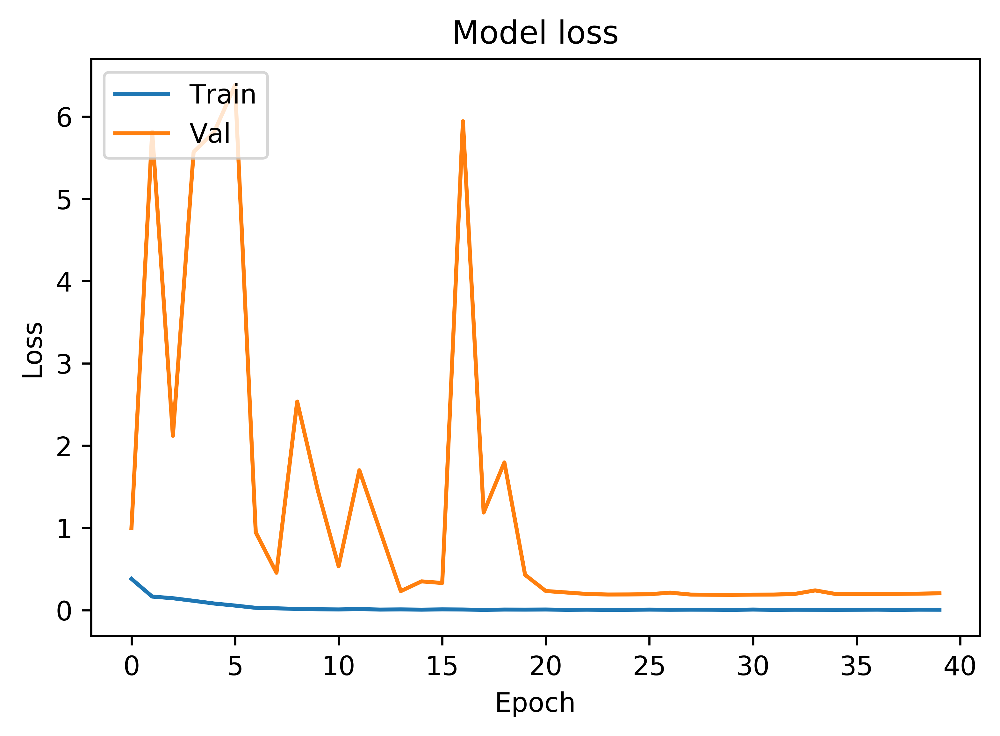

Results from K-fold: 5
acc: 96.08%
1045/1045 [==============================] - 2s 2ms/step
[0.2046285175516729, 0.9607655502392345]
          normal  abnormal
normal       648        20
abnormal      21       356
              precision    recall  f1-score   support

      normal       0.97      0.97      0.97       668
    abnormal       0.95      0.94      0.95       377

   micro avg       0.96      0.96      0.96      1045
   macro avg       0.96      0.96      0.96      1045
weighted avg       0.96      0.96      0.96      1045

Average for kfold accuracy and stdev
96.08% (+/- 0.26%)
Average classification report for all folds
              precision  recall  f1_score  support
class                                             
abnormal          0.950   0.940     0.946    377.6
macro_avg         0.958   0.958     0.958   1045.8
micro_avg         0.960   0.960     0.960   1045.8
normal            0.968   0.970     0.970    668.2
weighted_avg      0.960   0.960     0.960   1045.8


In [15]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for key, kfold in kfolds.items():
    print(key)
    train = kfold['train']
    val = kfold['valid']
    
    print('K-: {}'.format(key))
        
    print("Samples from Training")
    print_samples(samples=train, images=X_image, text=X_text, tokenizer=tokenizer)
    print("============================")
    
    print("Samples from Validation")
    print_samples(samples=val, images=X_image, text=X_text, tokenizer=tokenizer)
    print("============================")
    
    text_image_model = Generate_Model(model_type='multimodal_square_kernel')
    img_loc = "unimodal_weights/best_weight_image_only_k-fold_{}.hdf5".format(count)
    txt_loc = "unimodal_weights/best_weight_text_2d_only_k-fold_{}.hdf5".format(count)
    set_weights(text_image_model.layers[-2], 'Image_Branch', img_loc)
    set_weights(text_image_model.layers[-2], 'Text_Branch', txt_loc) 
    text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="model_fusion_weights/best_weight_image_text_square_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_image_model.fit([X_text[train], X_image[train]], y[train], 
                     epochs=epochs, batch_size=bs, validation_data=([X_text[val], X_image[val]], y[val]), callbacks=callbacks_list)
    plot_model_history(history)
    filepath="model_fusion_weights/final_weight_image_text_square_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[val], X_image[val]], y[val], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[val], X_image[val], y[val]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[val]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    cr = classification_report([np.argmax(t) for t in y[val]], y_hat, target_names=class_names)
    report_list.append(classification_report_df(cr))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))
print("Average classification report for all folds")
print(df_mean(report_list))

In [16]:
reduce_lr_final = ReduceLROnPlateau(monitor='loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
text_image_model = Generate_Model(model_type = 'multimodal_square_kernel')
img_loc = "unimodal_weights/best_weight_image_only_final.hdf5"
txt_loc = "unimodal_weights/best_weight_text_2d_only_final.hdf5"
set_weights(text_image_model.layers[-2], 'Image_Branch', img_loc)
set_weights(text_image_model.layers[-2], 'Text_Branch', txt_loc) 
text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
filepath="model_fusion_weights/best_weight_image_text_square_final.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr_final, checkpoint, early_stopping]

history = text_image_model.fit([X_text[final_train], X_image[final_train]], y[final_train], 
                 epochs=epochs, batch_size=bs, validation_data=None, callbacks=callbacks_list)
filepath="model_fusion_weights/best_weight_image_text_square_final.hdf5"
text_image_model.save_weights(filepath)
print('========================TEST MODEL=======================')
scores = text_image_model.evaluate([X_text[final_test], X_image[final_test]], y[final_test], verbose=0)
print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
y_hat = test_model(text_image_model, zip(X_text[final_test], X_image[final_test], y[final_test]), image = True, text = True, 
                   class_names=class_names)

[INFO] training with 2 GPUs...
Epoch 1/150
5229/5229 [==============================] - 32s 6ms/step - loss: 0.1294 - acc: 0.9602

Epoch 00001: acc improved from -inf to 0.96022, saving model to model_fusion_weights/best_weight_image_text_square_final.hdf5
Epoch 2/150
5229/5229 [==============================] - 15s 3ms/step - loss: 0.0750 - acc: 0.9767

Epoch 00002: acc improved from 0.96022 to 0.97667, saving model to model_fusion_weights/best_weight_image_text_square_final.hdf5
Epoch 3/150
5229/5229 [==============================] - 15s 3ms/step - loss: 0.0827 - acc: 0.9759

Epoch 00003: acc did not improve from 0.97667
Epoch 4/150
5229/5229 [==============================] - 15s 3ms/step - loss: 0.0671 - acc: 0.9784

Epoch 00004: acc improved from 0.97667 to 0.97839, saving model to model_fusion_weights/best_weight_image_text_square_final.hdf5
Epoch 5/150
5229/5229 [==============================] - 15s 3ms/step - loss: 0.0393 - acc: 0.9876

Epoch 00005: acc improved from 0.97839 

### Inspect images

blue = ground truth, red = prediction


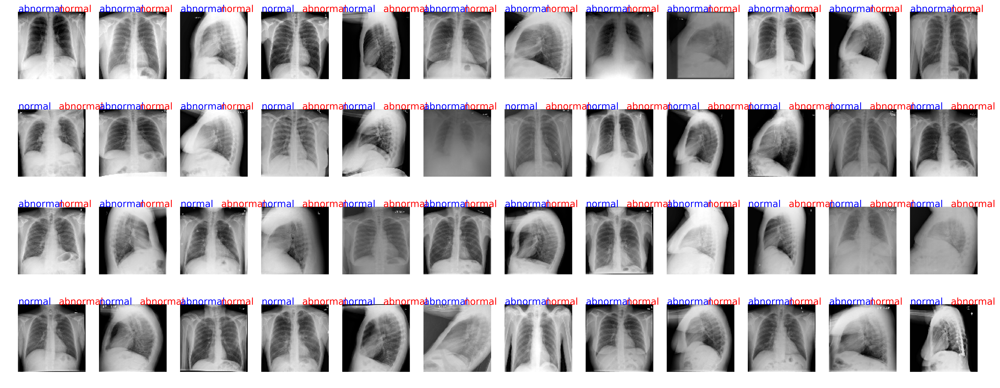

In [17]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[final_test] ]
test_wrong = [im for im in zip(X_image[final_test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')